In [2]:
import numpy as np
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.legend import Legend
import matplotlib.colors as colors
from matplotlib import cm
from mpl_toolkits.mplot3d import axes3d

import pandas as pd
import scipy

#from sklearn import datasets
#from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import RocCurveDisplay
from sklearn.preprocessing import LabelBinarizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import StandardScaler

from numba import jit

#Import models
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RepeatedStratifiedKFold

#Import evaluation metrics
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score

sns.set

epsilon =  10.**(-32.)

In [3]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap


cmap = plt.get_cmap('tab10')
new_cmap = truncate_colormap(cmap, 0., 0.6)


### Import data

In [4]:
#Patient ids
pt_keyDF = pd.read_csv('/Users/oipulk/Documents/prime_data/preprocessed/combinedTPM_pt_id_key.csv', index_col=0,header=1)
cohort_names = np.array(['Hugo', 'Riaz', 'Liu', 'Gide', 'Newell', 'Cm38', 'Cm64', 'Cm67'])
PMID_dict = {'Hugo':'PMID: 26997480', 'Riaz': 'PMID: 29033130', 'Liu':'PMID: 31792460', 'Gide':'PMID: 30753825', 
'Newell':'PMID: 34951955', 'Cm38': 'PMID: 37037616', 'Cm64': 'PMID: 37037616', 'Cm67': 'PMID: 37037616'}

In [5]:
# Import TPM-normalized, batch-corrected data 
# Only housekeeping gene correction in latent space. This is our preferred method because it does not assume raw counts as input
log2tpm_bc = pd.read_csv('/Users/oipulk/Documents/prime_data/preprocessed/log2tpm_batch_corrected_hkpca.csv', index_col=0)
tpm_bc = pd.read_csv('/Users/oipulk/Documents/prime_data/preprocessed/tpm_batch_corrected_hkpca.csv', index_col=0)

print(log2tpm_bc.shape)
print(tpm_bc.shape)

(18505, 323)
(18505, 323)


In [6]:
#iRECIST: PD=1, SD=2, PR=3, CR=4
irs = pd.read_csv('/Users/oipulk/Documents/prime_data/preprocessed/combinedIR_score_df.csv', index_col=0)
irs.columns = ['iR_score']
print(irs.shape)

(323, 1)


In [7]:
#Batch corrected tmb
tmbDF = pd.read_csv('/Users/oipulk/Documents/prime_data/preprocessed/combined_logTMB_bc.csv',  index_col=0)

batch_inds = np.load('/Users/oipulk/Documents/prime_data/batch_inds.npy') 
batch_inds = batch_inds.astype(int)

#Define auxiliary tmb data imputed with zeros
TMB_aux = np.copy(tmbDF)
tmb_measured = np.where(~np.isnan(TMB_aux))[0]
TMB_aux[np.isnan(TMB_aux)]=np.mean(TMB_aux[~np.isnan(TMB_aux)])
TMB_aux = TMB_aux.reshape(-1,1)
print(TMB_aux.shape)

(323, 1)


In [8]:
# Numbers of patients in each cohort
for i in np.arange(1,len(cohort_names)+1):
    print(cohort_names[i-1], PMID_dict[cohort_names[i-1]], '('+str(len(np.where(batch_inds==i)[0]))+')')
    print(pt_keyDF.iloc[:,np.where(batch_inds==i)[0]].values[0])
    

Hugo PMID: 26997480 (27)
['Pt1' 'Pt2' 'Pt4' 'Pt5' 'Pt6' 'Pt7' 'Pt8' 'Pt9' 'Pt10' 'Pt12' 'Pt13'
 'Pt14' 'Pt15' 'Pt16' 'Pt19' 'Pt20' 'Pt22' 'Pt23' 'Pt25' 'Pt27' 'Pt28'
 'Pt29' 'Pt31' 'Pt32' 'Pt35' 'Pt37' 'Pt38']
Riaz PMID: 29033130 (25)
['Pt23' 'Pt59' 'Pt66' 'Pt76' 'Pt89' 'Pt94' 'Pt77' 'Pt84' 'Pt62' 'Pt72'
 'Pt3' 'Pt4' 'Pt5' 'Pt9' 'Pt10' 'Pt18' 'Pt24' 'Pt27' 'Pt29' 'Pt30' 'Pt31'
 'Pt8' 'Pt11' 'Pt28' 'Pt44']
Liu PMID: 31792460 (116)
['Patient100' 'Patient102' 'Patient105' 'Patient106' 'Patient107'
 'Patient108' 'Patient10' 'Patient112' 'Patient116' 'Patient117'
 'Patient11' 'Patient121' 'Patient125' 'Patient126' 'Patient127'
 'Patient130' 'Patient131' 'Patient132' 'Patient133' 'Patient134'
 'Patient135' 'Patient137' 'Patient13' 'Patient140' 'Patient141'
 'Patient142' 'Patient143' 'Patient144' 'Patient145' 'Patient146'
 'Patient147' 'Patient148' 'Patient149' 'Patient14' 'Patient150'
 'Patient154' 'Patient155' 'Patient156' 'Patient158' 'Patient159'
 'Patient15' 'Patient162' 'Patient163' 'Pa

In [9]:
evaluable_irs = np.where(irs>0)[0]

In [10]:
#Include only patients with evaluable response (PD=1, SD=2, PR=3 or CR=4, not NE=0)
evaluable_irs = np.where(irs>0)[0]
tpm_bc = tpm_bc.iloc[:,evaluable_irs]
log2tpm_bc = log2tpm_bc.iloc[:,evaluable_irs]
TMB_aux = TMB_aux[evaluable_irs]
tmb_measured = np.intersect1d(tmb_measured, evaluable_irs)
irs_ = irs.iloc[evaluable_irs]
irs = irs_
del(irs_)
print(log2tpm_bc.shape,TMB_aux.shape, irs.shape) 

(18505, 321) (321, 1) (321, 1)


In [11]:
batch_inds = batch_inds[evaluable_irs]
len(batch_inds)

321

### Define responders and disease control

In [12]:
responders = (irs>2).astype(int)
dc = (irs>1).astype(int)
cr = (irs>3).astype(int)

### Define PSP and GSP gene sets 

In [13]:
gspDF = pd.read_csv('/Users/oipulk/Documents/prime_data/preprocessed/gsp_clin_noiRECISTNans.csv',low_memory=False, index_col=0)
pspDF = pd.read_csv('/Users/oipulk/Documents/prime_data/preprocessed/psp_clin_noiRECISTNans.csv',low_memory=False, index_col=0)

gsp_genes = gspDF.index.values[13:len(gspDF.index.values)]
psp_genes = pspDF.index.values[13:len(pspDF.index.values)]
ctl_genes = ['CD8A', 'CD8B', 'GZMA', 'GZMB', 'PRF1']

gsp_genes = np.intersect1d(gsp_genes,log2tpm_bc.index.values)
psp_genes = np.intersect1d(psp_genes, log2tpm_bc.index.values)

#SIT1 and VNN2 were missing from GSP
gsp_genes = np.append(np.append(gsp_genes, 'SIT1'), 'VNN2')
gsp_genes = np.sort(gsp_genes)

### Define functions

In [14]:
def compute_ctl_score(dataDF):
    
    # Sum tpm counts over ctl genes
    ctl_genes = ['CD8A', 'CD8B', 'GZMA', 'GZMB', 'PRF1']
    ctl_score = dataDF.loc[ctl_genes].mean()
    ctlDF = pd.DataFrame(data=ctl_score, columns = ['CTL score'])
    
    
    return ctlDF

### Compute TIDE scores

In [15]:
# # Anonymize patients
to_tide_data = log2tpm_bc.copy()

# to_tide_data1.columns = np.arange(to_tide_data1.shape[1])
to_tide_data.columns = np.arange(to_tide_data.shape[1])
# Subtract mean
to_tide_data = to_tide_data - np.mean(to_tide_data, axis=0)

# print(to_tide_data1.shape)
print(to_tide_data.shape)

to_tide_data.to_csv('/Users/oipulk/Documents/prime_data/tide/to_tide_data_hkpca.csv', sep='\t')


######################################
# Analysis at TIDE website
# http://tide.dfci.harvard.edu/
######################################



(18505, 321)


In [16]:
tide_res =  pd.read_csv('/Users/oipulk/Documents/prime_data/tide/tide_results.csv')
print(tide_res)

#Remove row of NaN's at the end of the list if it exists 
tide_res = tide_res.iloc[0:(tide_res.shape[0]-1),:]

tide_res = tide_res.sort_values(by=['Patient'])

tide_df = pd.DataFrame(data = tide_res.values, index= log2tpm_bc.keys(), columns= tide_res.columns )

print('Tide responders with default threshold:',np.where(tide_df['Responder'].values)[0])

     Patient No benefits Responder  TIDE  IFNG  MSI Expr Sig  Merck18  CD274  \
0      172.0       False     False  2.64 -0.86          0.29    -0.34  -2.95   
1      157.0       False     False  2.61 -0.93          0.50    -0.53  -2.69   
2        8.0        True     False  2.58 -1.69          0.27    -1.09  -2.02   
3      213.0       False     False  2.55 -0.15          0.48    -0.05  -1.97   
4      220.0        True     False  2.52 -1.02          0.50    -0.63  -1.98   
..       ...         ...       ...   ...   ...           ...      ...    ...   
317    222.0       False      True -1.63  2.87          0.83     0.91   1.54   
318     90.0       False      True -1.64  2.80          0.73     1.80   0.66   
319    240.0       False      True -1.71  2.23          0.68     1.97   1.34   
320    233.0       False      True -1.75  3.58          0.91     1.68   3.18   
321      NaN         NaN       NaN   NaN   NaN           NaN      NaN    NaN   

      CD8 CTL.flag  Dysfunction  Exclus

In [17]:
tide_df

,Patient,No benefits,Responder,TIDE,IFNG,MSI Expr Sig,Merck18,CD274,CD8,CTL.flag,Dysfunction,Exclusion,MDSC,CAF,TAM M2
HUGO.0,0.0,False,False,1.7,1.94,0.57,0.96,-0.47,-0.58,False,-1.66,1.7,0.07,0.19,-0.01
HUGO.1,1.0,False,False,0.74,2.52,0.92,1.31,0.34,-0.5,False,-1.88,0.74,0.02,0.11,-0.02
HUGO.2,2.0,False,False,1.4,0.65,0.21,-0.08,-0.32,-1.27,False,-1.94,1.4,0.09,0.11,0.01
HUGO.3,3.0,True,False,1.67,-1.88,0.76,-1.16,-1.12,-3.18,False,-2.22,1.67,0.11,0.11,0.02
HUGO.4,4.0,True,False,1.19,-1.39,0.72,-0.86,-1.27,-2.85,False,-1.82,1.19,0.04,0.14,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CM67.12,316.0,False,False,0.59,1.7,0.33,1.67,0.21,0.94,False,-0.98,0.59,0.05,0.07,-0.03
CM67.13,317.0,False,False,2.01,-0.33,0.75,-0.37,-1.99,-2.61,False,-2.22,2.01,0.14,0.14,0.01
CM67.14,318.0,False,False,1.75,-0.21,0.41,-0.11,-1.82,-1.83,False,-1.94,1.75,0.12,0.12,0.02
CM67.15,319.0,False,False,1.87,-0.09,0.78,-0.12,-1.96,-1.98,False,-2.05,1.87,0.11,0.14,0.02


### Compute IMPRES scores

In [18]:
# IMPRES gene pairs (gene names adapted to our data, eg. VISTA->VSIR)
IMPRES_pairs = {'Gene1': ['PDCD1', 'CD27', 'CTLA4', 'CD40', 'CD86', 'CD28', 'CD80', 'CD274', 'CD86', 'CD40', 'CD86', 'CD40', 'CD28', 'CD40', 'TNFRSF14'],
                 'Gene2': ['TNFSF4', 'PDCD1', 'TNFSF4', 'CD28', 'TNFSF4', 'CD86', 'TNFSF9', 'VSIR', 'HAVCR2', 'PDCD1', 'CD200', 'CD80', 'CD276', 'CD274', 'CD86']}
IMPRESDF = pd.DataFrame(data=IMPRES_pairs)

In [19]:
# IMPRES gene pairs (gene names adapted to our data, eg. VISTA->VSIR)
IMPRES_pairs = {'Gene1': ['PDCD1', 'CD27', 'CTLA4', 'CD40', 'CD86', 'CD28', 'CD80', 'CD274', 'CD86', 'CD40', 'CD86', 'CD40', 'CD28', 'CD40', 'TNFRSF14'],
                 'Gene2': ['TNFSF4', 'PDCD1', 'TNFSF4', 'CD28', 'TNFSF4', 'CD86', 'TNFSF9', 'VSIR', 'HAVCR2', 'PDCD1', 'CD200', 'CD80', 'CD276', 'CD274', 'CD86']}
IMPRESDF = pd.DataFrame(data=IMPRES_pairs)

def compute_IMPRES(single_pt_xpr_df, IMPRES_df):
    
    '''''''''
    Input single_pt_xpr_df must be a pandas dataframe with gene names as index 
    and expression data as values
    '''''''''
    IMPRES_score=0
    
    for row in np.arange(IMPRES_df.shape[0]):
        
        gene1 = IMPRES_df['Gene1'][row]
        gene2 = IMPRES_df['Gene2'][row]
        
        if single_pt_xpr_df.loc[gene1].values.astype(float) < single_pt_xpr_df.loc[gene2].values.astype(float):
            
            IMPRES_score = IMPRES_score+1
            
    return IMPRES_score

In [20]:
IMPRES_scores = np.array([])

for ptInd in np.arange(0,log2tpm_bc.shape[1]):
    
    ptName = log2tpm_bc.keys()[ptInd]
    
    pt_score = compute_IMPRES(log2tpm_bc[[ptName]], IMPRESDF)
    IMPRES_scores = np.append(IMPRES_scores,pt_score)
    

# Develop Prime signature

In [21]:
stat_res = pd.read_csv('DESeq2_results.csv', index_col=0)

## Note: The results are completely different Without batch information in design formula
# stat_res = pd.read_csv('DESeq2_results_noBC.csv', index_col=0)

LFC_cutoff = 0.5
p_cutoff = 0.05

bc_dr = np.where( (stat_res.padj.values<p_cutoff)&(stat_res.log2FoldChange.values< -LFC_cutoff) )[0]
bc_ur = np.where( (stat_res.padj.values<p_cutoff)&(stat_res.log2FoldChange.values > LFC_cutoff) )[0]

# print('Down-regulated genes:', stat_res.index[bc_dr].values)
# print('Up-regulated genes:', stat_res.index[bc_ur].values)

stat_res.to_csv('DEA_results_3cohorts.csv')

In [22]:
gsp_psp_stats_all = stat_res.loc[np.append(psp_genes,gsp_genes)]

gsp_psp_stats = stat_res.loc[np.append(np.intersect1d(psp_genes,stat_res.index[bc_dr].values),np.intersect1d(gsp_genes,stat_res.index[bc_ur].values))]

# e-based log used in the signature definition
scores = np.abs(gsp_psp_stats['log2FoldChange'].values)-np.log(gsp_psp_stats['padj'].values)

gsp_psp_stats['score'] = np.abs(gsp_psp_stats['log2FoldChange'].values)-np.log(gsp_psp_stats['padj'].values)

# scores = gsp_psp_stats.iloc[np.argsort(gsp_psp_stats['score'])[::-1],:]['score'] 
norm_scores = (scores - np.mean(scores))
weights = np.exp(norm_scores)/np.sum(np.exp(norm_scores))
weights[weights<10**(-2)]=0
weights = weights/sum(weights)

gsp_psp_stats['norm_score'] = norm_scores
gsp_psp_stats['weights'] = weights

gsp_psp_stats.to_csv('DEA_results_3cohorts_gsp_psp_genes.csv')
gsp_psp_stats

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,score,norm_score,weights
ARHGAP42,2573.592785,-0.611698,0.176612,-3.463523,5.331508e-04,0.030118,4.114331,-1.375420,0.000000
DCUN1D5,1609.022415,-0.523445,0.143482,-3.648166,2.641193e-04,0.020147,4.428140,-1.061610,0.000000
GPSM1,796.090485,-0.614065,0.160600,-3.823571,1.315326e-04,0.013497,4.919378,-0.570373,0.000000
RCOR2,111.330398,-0.986066,0.251402,-3.922273,8.771739e-05,0.010918,5.503436,0.013686,0.000000
ADAMDEC1,986.645098,1.086331,0.335860,3.234475,1.218667e-03,0.047852,4.125980,-1.363771,0.000000
...,...,...,...,...,...,...,...,...,...
TRGV10,44.105660,1.289952,0.306229,4.212377,2.526978e-05,0.004771,6.635175,1.145424,0.000000
TRIM69,404.330179,0.549323,0.143277,3.833999,1.260766e-04,0.013381,4.863275,-0.626476,0.000000
TVP23A,104.420780,0.744216,0.216593,3.436005,5.903604e-04,0.031465,4.203111,-1.286640,0.000000
WARS,19863.291723,1.037038,0.196741,5.271078,1.356245e-07,0.000205,9.529941,4.040191,0.141130


In [23]:
## Import DEA results and Boltzmann weights for GSP'/PSP genes
# gsp_psp_stats = pd.read_csv('/Users/oipulk/Documents/prime_v3/nb/analyses/Logistic_Regression/DEA_results_3cohorts_gsp_psp_genes.csv', index_col=0)


In [24]:
# Genes with nonzero weight decreasing order of weights
weights = gsp_psp_stats['weights'].values
weights_nonzero = gsp_psp_stats.iloc[np.where(weights>0)]
weights_nonzero.iloc[np.argsort(weights_nonzero['weights'])[::-1],:]

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,score,norm_score,weights
SLAMF7,1885.991329,1.470393,0.280130,5.248970,1.529518e-07,0.000208,9.946779,4.457028,0.214116
PLA2G2D,644.761020,1.927048,0.383650,5.022936,5.088747e-07,0.000470,9.590610,4.100859,0.149957
WARS,19863.291723,1.037038,0.196741,5.271078,1.356245e-07,0.000205,9.529941,4.040191,0.141130
CXCL13,1189.248212,1.879027,0.384821,4.882862,1.045572e-06,0.000614,9.274932,3.785181,0.109363
SLAMF1,655.656977,1.760477,0.357156,4.929158,8.258491e-07,0.000599,9.180031,3.690280,0.099461
CXCL11,347.129397,1.608048,0.337431,4.765555,1.883345e-06,0.000981,8.535344,3.045593,0.052200
IRF1,2531.776869,1.011460,0.205671,4.917852,8.749882e-07,0.000605,8.420969,2.931218,0.046558
NUGGC,173.024604,1.445965,0.306454,4.718369,2.377429e-06,0.001139,8.223672,2.733921,0.038222
XIRP1,67.582880,1.701135,0.370103,4.596388,4.298781e-06,0.001661,8.101641,2.611891,0.033831
LAP3,6395.602530,0.623541,0.127385,4.894921,9.834498e-07,0.000614,8.019446,2.529696,0.031161


In [25]:
signature_genes = weights_nonzero.iloc[np.argsort(weights_nonzero['weights'])[::-1],:].index.tolist()
print(signature_genes)

['SLAMF7', 'PLA2G2D', 'WARS', 'CXCL13', 'SLAMF1', 'CXCL11', 'IRF1', 'NUGGC', 'XIRP1', 'LAP3', 'CXCL9', 'CXCL10', 'TNFAIP3', 'PPP1R16B', 'GBP1']


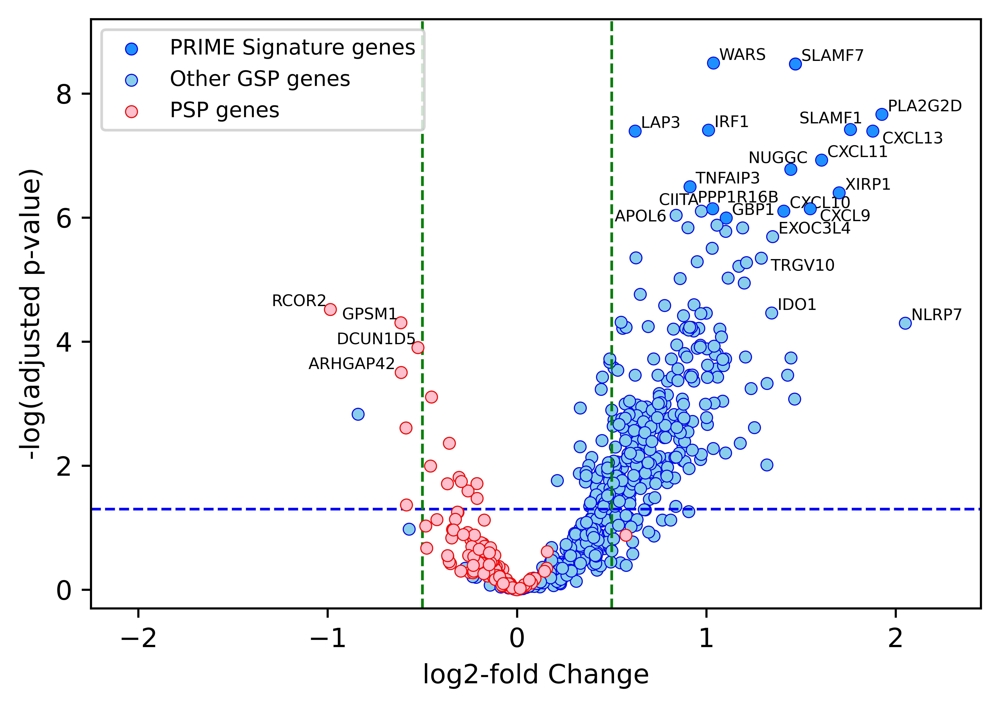

In [26]:
plt.rcParams['ytick.right'] = False
plt.rcParams['ytick.labelright'] = False
plt.rcParams['ytick.left'] = True
plt.rcParams['ytick.labelleft'] = True


# Create the volcano plot
plt.figure(figsize=(6, 4), dpi=1200)

plt.scatter(gsp_psp_stats_all.loc[signature_genes[0]]['log2FoldChange'], -np.log(gsp_psp_stats_all.loc[signature_genes[0]]['padj']), c='dodgerblue', edgecolor='blue' ,linewidths=0.4, alpha=1, s=20, zorder=25, label='PRIME Signature genes')
plt.scatter(gsp_psp_stats_all.loc[gsp_genes[0]]['log2FoldChange'], -np.log(gsp_psp_stats_all.loc[gsp_genes[0]]['padj']), c='skyblue', edgecolor='blue',linewidths=0.4, alpha=1,s=20, zorder=1, label='Other GSP genes')
plt.scatter(gsp_psp_stats_all.loc[psp_genes[0]]['log2FoldChange'], -np.log(gsp_psp_stats_all.loc[psp_genes[0]]['padj']), c='pink', edgecolor='red',linewidths=0.4, alpha=1,s=20, zorder=10, label='PSP genes')


for gene in gsp_genes[1:len(gsp_genes)]:

    plt.scatter(gsp_psp_stats_all.loc[gene]['log2FoldChange'], -np.log(gsp_psp_stats_all.loc[gene]['padj']), c='skyblue', edgecolor='blue',linewidths=0.4, alpha=1,s=20, zorder=1)


for gene in psp_genes:

    plt.scatter(gsp_psp_stats_all.loc[gene]['log2FoldChange'], -np.log(gsp_psp_stats_all.loc[gene]['padj']), c='pink', edgecolor='red',linewidths=0.4, alpha=1,s=20, zorder=10)


for gene in signature_genes[1:len(signature_genes)]:

    plt.scatter(gsp_psp_stats_all.loc[gene]['log2FoldChange'], -np.log(gsp_psp_stats_all.loc[gene]['padj']), c='dodgerblue',  alpha=1,s=10, zorder=25)


plt.legend(loc="upper left", fontsize=8)

plt.xlabel('log2-fold Change')
plt.ylabel('-log(adjusted p-value)')

# plt.title('Differentially expressed genes for response in combined cohorts (Gide, Hugo, Riaz)')

plt.axhline(-np.log10(0.05), color='blue', linestyle='--', linewidth=1)
plt.axvline(LFC_cutoff, color='green', linestyle='--', linewidth=1)
plt.axvline(-LFC_cutoff, color='green', linestyle='--', linewidth=1)
plt.grid(False)

# Add gene names
for gene, row in gsp_psp_stats.iterrows():

    if np.isin(gene, ['RCOR2','GPSM1','DCUN1D5','ARHGAP42']):

        plt.text(row['log2FoldChange']-0.06*len(gene)-0.01,-np.log(row['padj'])+0.055, gene, fontsize=6, zorder=20)

    if np.isin(gene, ['CXCL10', 'CXCL11', 'GBP1', 'IRF1', 'LAP3',
       'PLA2G2D', 'SLAMF7', 'TNFAIP3', 'WARS', 'XIRP1','IDO1', 'NLRP7','EXOC3L4']):

        plt.text(row['log2FoldChange']+0.03,-np.log(row['padj'])+0.05, gene, fontsize=6, zorder=20)
    
    if np.isin(gene, ['SLAMF1', 'NUGGC','CIITA']):
        
        plt.text(row['log2FoldChange']-0.045*len(gene),-np.log(row['padj'])+0.1, gene, fontsize=6, zorder=20)

    if np.isin(gene, ['CXCL9','CXCL13','TRGV10']):

        plt.text(row['log2FoldChange']+0.05,-np.log(row['padj'])-0.2, gene, fontsize=6, zorder=20)
    

    if np.isin(gene, ['APOL6']):

         plt.text(row['log2FoldChange']-0.065*len(gene),-np.log(row['padj'])-0.1, gene, fontsize=6, zorder=20)


    
    if np.isin(gene, ['PPP1R16B']):  


        plt.text(row['log2FoldChange']-0.01*len(gene),-np.log(row['padj'])+0.1, gene, fontsize=6, zorder=20)


plt.ylim(-0.3,9.2)

plt.xlim(-2.25,2.45)


plt.savefig('volcano_3_cohorts.pdf', bbox_inches='tight')
plt.show()




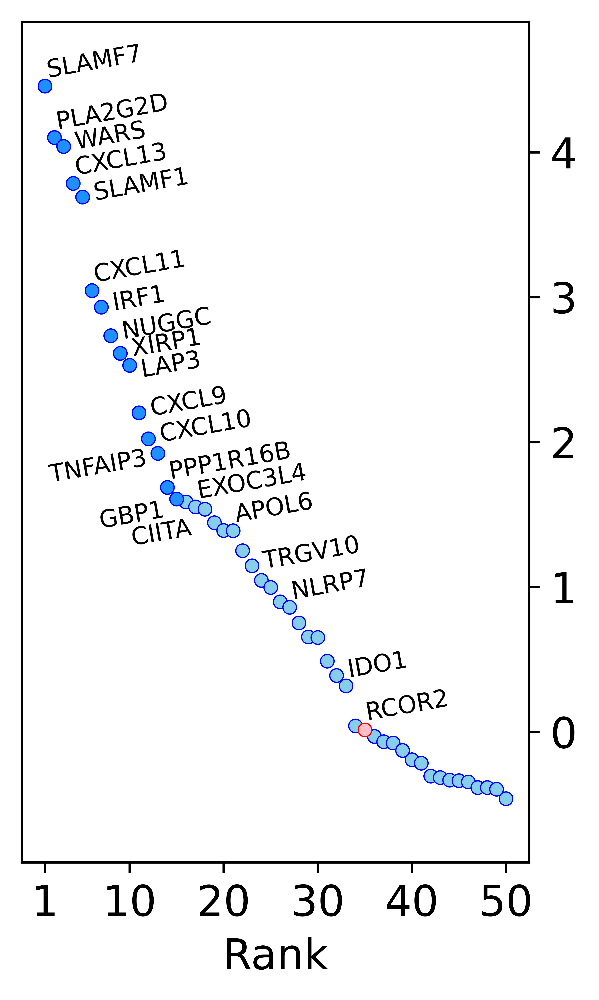

In [27]:
plt.rcParams['ytick.right'] = True
plt.rcParams['ytick.labelright'] = True
plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.labelleft'] = False


plt.figure(figsize=(3,5), dpi=1200)

sorted_prime_positions = np.where(gsp_psp_stats.iloc[np.argsort(gsp_psp_stats['norm_score'])[::-1][0:50],:].index.isin(signature_genes))[0]
sorted_gsp_positions = np.where(gsp_psp_stats.iloc[np.argsort(gsp_psp_stats['norm_score'])[::-1],:][0:50].index.isin(gsp_genes))[0]
sorted_psp_positions = np.where(gsp_psp_stats.iloc[np.argsort(gsp_psp_stats['norm_score'])[::-1],:][0:50].index.isin(psp_genes))[0]

sorted_gsp_psp_scores = gsp_psp_stats.iloc[np.argsort(gsp_psp_stats['norm_score'])[::-1][0:50],:]

sorted_gsp_psp_genes = sorted_gsp_psp_scores.index.tolist()

plt.scatter(sorted_prime_positions+1,sorted_gsp_psp_scores['norm_score'].values[sorted_prime_positions], s=20, c='dodgerblue', edgecolor='blue',linewidths=0.4, alpha=1, zorder=10)
plt.scatter(sorted_gsp_positions+1,sorted_gsp_psp_scores['norm_score'].values[sorted_gsp_positions], s=20, c='skyblue', edgecolor='blue',linewidths=0.4, alpha=1, zorder=1)
plt.scatter(sorted_psp_positions+1,sorted_gsp_psp_scores['norm_score'].values[sorted_psp_positions], s=20, c='pink', edgecolor='red',linewidths=0.4)

i=1
for gene, row in sorted_gsp_psp_scores.iterrows():

    if np.isin(gene, ['RCOR2','GPSM1','DCUN1D5','ARHGAP42']):

        plt.text(i-0.1,row['norm_score']+0.07, gene, fontsize=8, zorder=20, rotation=10)

    
    if np.isin(gene, ['CXCL11',  'CXCL13',
       'PLA2G2D', 'PPP1R16B', 'SLAMF7',  'IDO1', 'NLRP7','EXOC3L4','APOL6']):

        plt.text(i,row['norm_score']+0.06, gene, fontsize=8, zorder=20, rotation=10)
    
    if np.isin(gene, ['CXCL10','IRF1','WARS','SLAMF1','XIRP1', 'NUGGC','CXCL9','TRGV10']):
        
        plt.text(i+1,row['norm_score']-0.02, gene, fontsize=8, zorder=20, rotation=10)
    
    if np.isin(gene, ['LAP3']):

        plt.text(i+1,row['norm_score']-0.08, gene, fontsize=8, zorder=20, rotation=10)    


    if np.isin(gene, ['TNFAIP3','GBP1']):

        plt.text(i-1.1*len(gene)-4,row['norm_score']-0.2, gene, fontsize=8, zorder=20, rotation=10)  

    if np.isin(gene, ['CIITA']):

        plt.text(i-len(gene)-1,row['norm_score']-0.3, gene, fontsize=8, zorder=20, rotation=10)  
        
    i=i+1
    
plt.xlabel('Rank', fontsize=14)
plt.xticks([1,10,20,30,40,50], size=14)

# plt.ylabel('Centered score')

plt.yticks([0,1,2,3,4], size=14)
plt.ylim(-0.9,4.9)

plt.savefig('gene_scores.pdf', bbox_inches='tight')

plt.show()

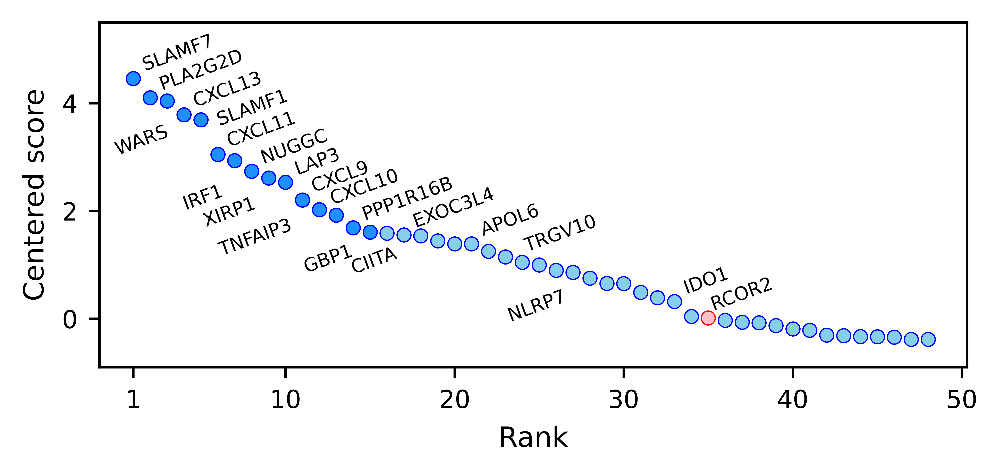

In [28]:
plt.rcParams['ytick.right'] = False
plt.rcParams['ytick.labelright'] = False
plt.rcParams['ytick.left'] =True
plt.rcParams['ytick.labelleft'] = True


plt.figure(figsize=(5,2), dpi=1200)

sorted_prime_positions = np.where(gsp_psp_stats.iloc[np.argsort(gsp_psp_stats['norm_score'])[::-1][0:48],:].index.isin(signature_genes))[0]
sorted_gsp_positions = np.where(gsp_psp_stats.iloc[np.argsort(gsp_psp_stats['norm_score'])[::-1],:][0:48].index.isin(gsp_genes))[0]
sorted_psp_positions = np.where(gsp_psp_stats.iloc[np.argsort(gsp_psp_stats['norm_score'])[::-1],:][0:48].index.isin(psp_genes))[0]

sorted_gsp_psp_scores = gsp_psp_stats.iloc[np.argsort(gsp_psp_stats['norm_score'])[::-1][0:48],:]

sorted_gsp_psp_genes = sorted_gsp_psp_scores.index.tolist()

plt.scatter(sorted_prime_positions+1,sorted_gsp_psp_scores['norm_score'].values[sorted_prime_positions], s=20, c='dodgerblue', edgecolor='blue',linewidths=0.4, alpha=1, zorder=10)
plt.scatter(sorted_gsp_positions+1,sorted_gsp_psp_scores['norm_score'].values[sorted_gsp_positions], s=20, c='skyblue', edgecolor='blue',linewidths=0.4, alpha=1, zorder=1)
plt.scatter(sorted_psp_positions+1,sorted_gsp_psp_scores['norm_score'].values[sorted_psp_positions], s=20, c='pink', edgecolor='red',linewidths=0.4)

i=1
for gene, row in sorted_gsp_psp_scores.iterrows():

    if np.isin(gene, ['RCOR2','GPSM1','DCUN1D5','ARHGAP42']):

        plt.text(i,row['norm_score']+0.15, gene, fontsize=6, zorder=20,rotation=20)

    # print(row, row['norm_score'], gene)
    # plt.text(i,row['norm_score'], gene, fontsize=5, zorder=20)

    
    if np.isin(gene, ['CXCL9','CXCL11',  'CXCL13','LAP3',
       'PLA2G2D', 'PPP1R16B', 'SLAMF7',  'IDO1', 'EXOC3L4','APOL6', 'NUGGC']):

        plt.text(i+0.4,row['norm_score']+0.15, gene, fontsize=6, zorder=20, rotation=20)
    
    if np.isin(gene, ['SLAMF1']):
        
        plt.text(i+0.8,row['norm_score']-0.1, gene, fontsize=6, zorder=20, rotation=20)

    if np.isin(gene, ['TRGV10']):
        
        plt.text(i+1,row['norm_score']+0.1, gene, fontsize=6, zorder=20, rotation=20)

    if np.isin(gene, ['CXCL10']):
        
        plt.text(i+0.5,row['norm_score']+0.1, gene, fontsize=6, zorder=20, rotation=20)
   
    if np.isin(gene, ['WARS']):

        plt.text(i-0.8*len(gene),row['norm_score']-1, gene, fontsize=6, zorder=20, rotation=20)  
    
    if np.isin(gene, ['NLRP7','XIRP1','IRF1']):

        plt.text(i-0.8*len(gene),row['norm_score']-0.9, gene, fontsize=6, zorder=20, rotation=20)  

    if np.isin(gene, ['TNFAIP3','GBP1']):

        plt.text(i-len(gene)-0.05,row['norm_score']-0.75, gene, fontsize=6, zorder=20, rotation=20)  

    if np.isin(gene, ['CIITA']):

        plt.text(i-2.25,row['norm_score']-0.75, gene, fontsize=6, zorder=20,rotation=20)  

        
    i=i+1
    
plt.xlabel('Rank', fontsize=9)
plt.xticks([1,10,20,30,40,50], size=8)

plt.ylabel('Centered score', fontsize=9)

plt.yticks([0,2,4], size=8)
plt.ylim(-0.9,5.5)
plt.xlim(-1,50.3)

plt.savefig('gene_scores_landscape.pdf', bbox_inches='tight')

plt.show()

In [29]:
sorted_gsp_psp_scores['norm_score'][np.exp(sorted_gsp_psp_scores['norm_score'])/np.sum(np.exp(sorted_gsp_psp_scores['norm_score']))>0.01]

SLAMF7      4.457028
PLA2G2D     4.100859
WARS        4.040191
CXCL13      3.785181
SLAMF1      3.690280
CXCL11      3.045593
IRF1        2.931218
NUGGC       2.733921
XIRP1       2.611891
LAP3        2.529696
CXCL9       2.202098
CXCL10      2.022611
TNFAIP3     1.922211
PPP1R16B    1.687075
GBP1        1.607094
CIITA       1.587034
EXOC3L4     1.552698
Name: norm_score, dtype: float64

In [30]:
gsp_psp_stats.iloc[np.argsort(gsp_psp_stats['weights'])[::-1]].to_csv('bDEA_results_and_PRIME_weights.csv')

### Performance in the 'training data', i.e. the original DEA set (=Hugo + Riaz + Gide)

In [31]:
from sklearn.metrics import roc_curve, auc

patients in test set: 123


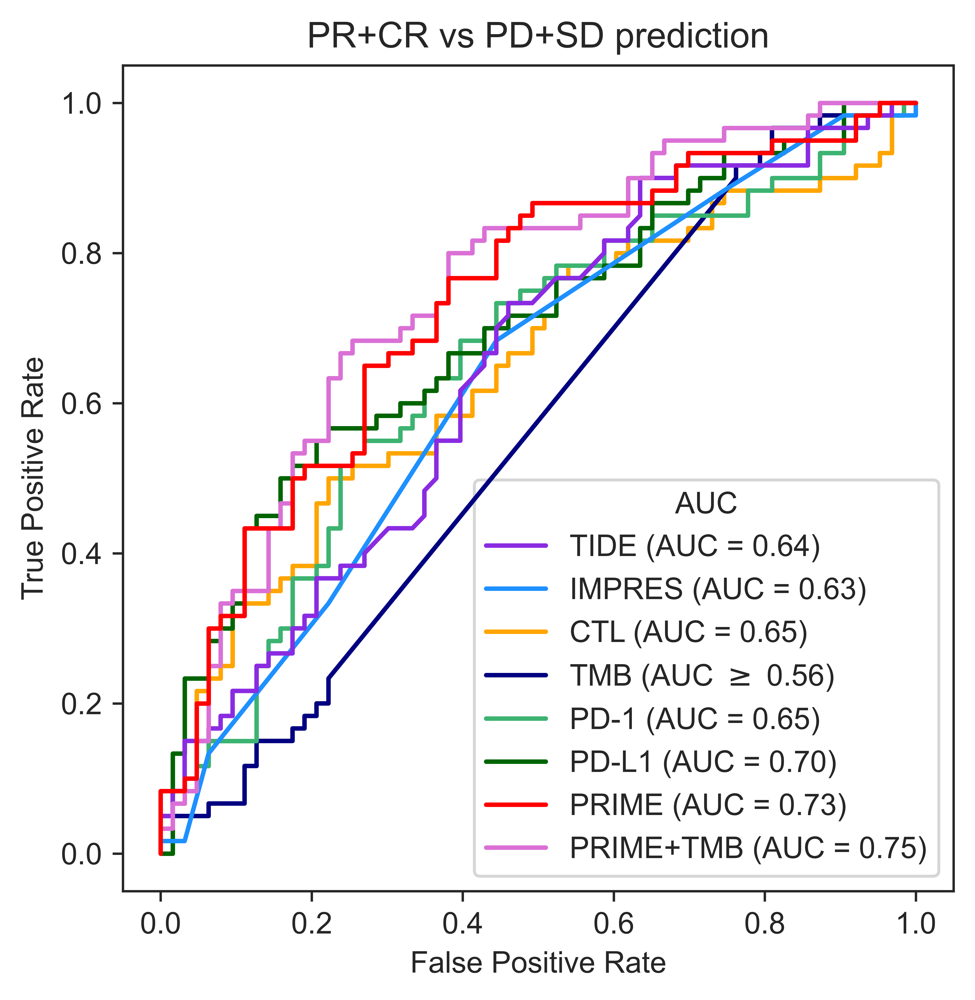

In [34]:
# Simple test without logistic regression by computing a scalar PRIME score

sns.set_style("ticks")

IRS = irs.values.T[0]
data = tpm_bc

#1.
tide_scores = tide_df['TIDE'].values
tide_scores = -tide_scores.reshape(-1,1)

#2.
IMPRES = -IMPRES_scores.reshape(-1,1)

#3.
ctlDF = compute_ctl_score(tpm_bc)
CTL = np.log2(1+ctlDF.values)


#4.
TMB =TMB_aux

#6. Add Prime gene expression multiplied by their weights to obtain a scalarized PRIME score
PRIME_score = np.matmul((weights.reshape(-1,1).T),np.log2(1+data.loc[gsp_psp_stats.index.values]).values.astype(float)).T

#7.
SGpd1 = np.log2(1+tpm_bc.loc[['PDCD1'] ].T.values.astype(float)).reshape(-1,1)

#8.
SGpdl1 = np.log2(1+tpm_bc.loc[['CD274']].T.values.astype(float)).reshape(-1,1)


CTL = (CTL - np.mean(CTL))/np.std(CTL)
PRIME = (PRIME_score - np.mean(PRIME_score))/np.std(PRIME_score)
TMB = (TMB - np.mean(TMB))/np.std(TMB)

SGpd1 = (SGpd1 - np.mean(SGpd1))/np.std(SGpd1)
SGpdl1 = (SGpdl1 - np.mean(SGpdl1))/np.std(SGpdl1)

IMPRES = (IMPRES - np.mean(IMPRES))/np.std(IMPRES)

TIDE = (tide_scores - np.mean(tide_scores))/np.std(tide_scores)

## ML Using iRECIST score (IRS>2 response, IRS>1 DC)
C, I, T, M, S, ST, PD1, PDL1, y = CTL, IMPRES, TIDE, TMB, PRIME_score, PRIME_score+TMB, SGpd1, SGpdl1, (IRS>2).astype(int)


random_state = np.random.RandomState(0)
# n_samples, n_features = X.shape
n_classes = len(np.unique(y))


mean_fpr = np.linspace(0, 1, 100)

test_patients_batch = np.where((batch_inds<3)|(batch_inds==4))[0] #Training set

print('patients in test set:',len(test_patients_batch))

fpr_t, tpr_t, thresholds_t = roc_curve(y[test_patients_batch], T[test_patients_batch])
roc_auc_t = auc(fpr_t, tpr_t)

fpr_c, tpr_c, thresholds_c = roc_curve(y[test_patients_batch], C[test_patients_batch])
roc_auc_c = auc(fpr_c, tpr_c)

fpr_m, tpr_m, thresholds_m = roc_curve(y[test_patients_batch], M[test_patients_batch])
roc_auc_m = auc(fpr_m, tpr_m)

fpr_i, tpr_i, thresholds_i = roc_curve(y[test_patients_batch], I[test_patients_batch])
roc_auc_i = auc(fpr_i, tpr_i)

fpr_sig1, tpr_sig1, thresholds_sig1 = roc_curve(y[test_patients_batch], S[test_patients_batch])
roc_auc_sig1 = auc(fpr_sig1, tpr_sig1)

fpr_sig2, tpr_sig2, thresholds_sig2 = roc_curve(y[test_patients_batch], ST[test_patients_batch])
roc_auc_sig2 = auc(fpr_sig2, tpr_sig2)

fpr_pd1, tpr_pd1, thresholds_pd1 = roc_curve(y[test_patients_batch], PD1[test_patients_batch])
roc_auc_pd1 = auc(fpr_pd1, tpr_pd1)

fpr_pdl1, tpr_pdl1, thresholds_pd1 = roc_curve(y[test_patients_batch], PDL1[test_patients_batch])
roc_auc_pdl1 = auc(fpr_pdl1, tpr_pdl1)

    
# Plotting the ROC curve
plt.figure(figsize=(5, 5), dpi=1200)

plt.plot(fpr_t, tpr_t, color='blueviolet', label='TIDE (AUC = %0.2f)' % roc_auc_t, zorder=8)
plt.plot(fpr_i, tpr_i, color='dodgerblue', label='IMPRES (AUC = %0.2f)' % roc_auc_i, zorder=7)
plt.plot(fpr_c, tpr_c, color='orange', label='CTL (AUC = %0.2f)' % roc_auc_c, zorder=6)
plt.plot(fpr_m, tpr_m, color='navy', label='TMB (AUC $\geq$ %0.2f)' % roc_auc_m, zorder=6)
plt.plot(fpr_pd1, tpr_pd1, color='mediumseagreen', label='PD-1 (AUC = %0.2f)' % roc_auc_pd1, zorder=6)
plt.plot(fpr_pdl1, tpr_pdl1, color='darkgreen', label='PD-L1 (AUC = %0.2f)' % roc_auc_pdl1, zorder=6)
plt.plot(fpr_sig1, tpr_sig1, color='red', label='PRIME (AUC = %0.2f)' % roc_auc_sig1, zorder=10)
plt.plot(fpr_sig2, tpr_sig2, color='orchid', label='PRIME+TMB (AUC = %0.2f)' % roc_auc_sig2, zorder=9)



# plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Random guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('PR+CR vs PD+SD prediction')
plt.legend(title='AUC',loc='lower right')

plt.savefig('ROC_single_test_DEA_cohorts.pdf', bbox_inches='tight')
plt.show()

# Run tests

### Collect statistics by repeated K-fold validation 

In [35]:
import random 
def partition_in_n_equal_parts(list_in, n, seed):

    '''Randomly splits a given list in equally-sized, non-overlapping parts'''
    
    random.Random(seed).shuffle(list_in)
    return [list_in[i::n] for i in range(n)]

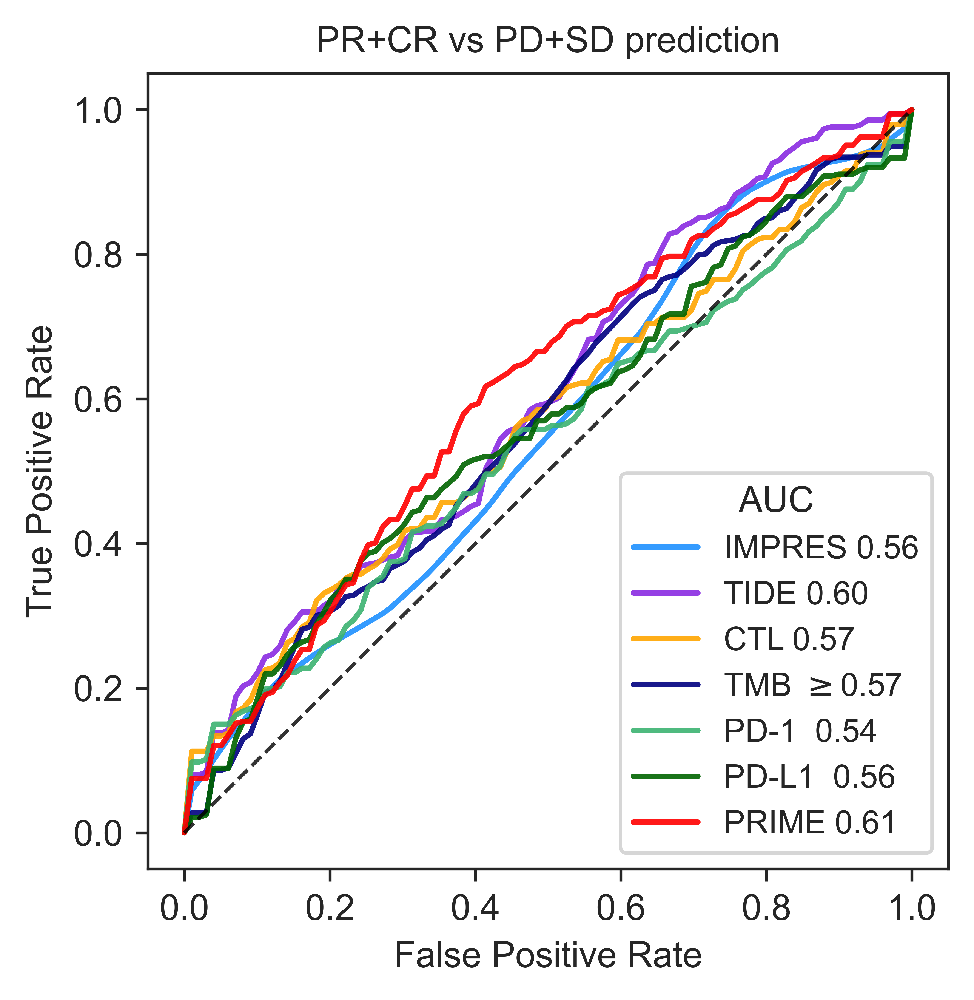

,Acc train,Acc test,Precision,Recall,AUROC,Delta AUROC
CTL,0.603122,0.590995,0.366948,0.506646,0.568299,0.080678
IMPRES,0.554777,0.545434,0.292163,0.439924,0.556120,0.059365
TIDE,0.603134,0.626199,0.244828,0.609293,0.602976,0.068066
TMB,0.553406,0.590816,0.211439,0.499084,0.568839,0.070901
PRIME,0.676106,0.615969,0.476425,0.536151,0.610854,0.064117
PD1,0.556845,0.565536,0.253564,0.443167,0.539382,0.053361
PDL1,0.622004,0.600893,0.365191,0.518301,0.562930,0.083947
CTL+TMB,0.610724,0.603699,0.418962,0.514019,0.588596,0.084524
PRIME+CTL,0.673796,0.613546,0.502111,0.536814,0.604384,0.080972
PRIME+TMB,0.679555,0.609617,0.489583,0.523011,0.613568,0.067363


In [36]:
# To get statistics, apply repeated stratified K-fold validation such that only the cohorts that were not used
# in signature development are randomly split into training and test sets, and the training set is merged with the signature 
# development cohorts (Hugo, Gide, Riaz).

sns.set_style("ticks")

IRS = irs.values.T[0]
data = tpm_bc

#1.
tide_scores = tide_df['TIDE'].values
tide_scores = -tide_scores.reshape(-1,1)

#2.
IMPRES = IMPRES_scores.reshape(-1,1)

#3.
ctlDF = compute_ctl_score(tpm_bc)
CTL = np.log2(1+ctlDF.values)


#4.
#Whether or not to include patients without tmb data
include_tmb_not_measured_in_training = True

TMB =TMB_aux

#6.    
PRIME = (weights.reshape(-1,1).T)*np.log2(1+data.loc[gsp_psp_stats.index.values]).T.values.astype(float)
PRIME =  PRIME[:,np.nonzero(np.sum(PRIME, axis=0))[0]]

# PRIME= np.matmul((weights.reshape(-1,1).T),np.log2(1+data.loc[gsp_psp_stats.index.values]).values.astype(float)).T


#7.
SGpd1 = np.log2(1+tpm_bc.loc[['PDCD1'] ].T.values.astype(float)).reshape(-1,1)

#8.
SGpdl1 = np.log2(1+tpm_bc.loc[['CD274']].T.values.astype(float)).reshape(-1,1)

# Apply standard scaling to all data
CTL = (CTL - np.mean(CTL))/np.std(CTL)
PRIME = (PRIME - np.mean(PRIME))/np.std(PRIME)
TMB = (TMB - np.mean(TMB))/np.std(TMB)

SGpd1 = (SGpd1 - np.mean(SGpd1))/np.std(SGpd1)
SGpdl1 = (SGpdl1 - np.mean(SGpdl1))/np.std(SGpdl1)

IMPRES = (IMPRES - np.mean(IMPRES))/np.std(IMPRES)

TIDE = (tide_scores - np.mean(tide_scores))/np.std(tide_scores)


# # ## CD8 stratification
# quantiles = np.quantile(log2tpm_bc.loc['CD8A'],[0.25,0.5,0.75])
# cd8hi = (log2tpm_bc.loc['CD8A']>quantiles[1]).astype(int)

# cd8 = log2tpm_bc.loc['CD8A']
# cd8 = ( cd8 - np.min(cd8))/( np.max(cd8) - np.min(cd8))

# PRIME = PRIME*cd8a


## ML Using iRECIST score (IRS>2 response, IRS>1 DC)
C, I, T, M, S, MS, PD1, PDL1, y = CTL, IMPRES, TIDE, TMB, PRIME, PRIME+TMB, SGpd1, SGpdl1, (IRS>2).astype(int)


random_state = np.random.RandomState(0)
# n_samples, n_features = X.shape
n_classes = len(np.unique(y))


tprsC = []

tprsI = []
tprsT = []

tprsP = []
tprsM = []
tprsCM = []


tprsS = []
tprsCS = []
tprsMS = []
tprsCMS = []

tprsPD1 = []
tprsPDL1 = []

mean_fpr = np.linspace(0, 1, 100)

N_splits=4
N_repeats=4
N_models = 11

acc_train=np.zeros((N_models,N_splits*N_repeats)) 
acc_test=np.zeros((N_models,N_splits*N_repeats))
precision=np.zeros((N_models,N_splits*N_repeats))
recall=np.zeros((N_models,N_splits*N_repeats))
auc = np.zeros((N_models,N_splits*N_repeats))

for n in np.arange(0,N_repeats):

    test_sets = np.where(np.isin(batch_inds,np.array([3,5,6,7,8])))[0]
    
    # Not enough patients to train logistic regression in CD8-stratified cohorts
    # quantiles = np.quantile(CTL,[0.,0.25,0.5,0.75])
    # pt_strat = np.where(CTL>quantiles[3])[0]
    # test_sets = np.intersect1d(pt_strat,test_sets)
    
    test_sets = partition_in_n_equal_parts(test_sets, N_splits, 101*n)

    for j in np.arange(N_splits):

        i = n*N_splits+j
        test_inds = test_sets[j]
        train_inds = np.setdiff1d(np.where(batch_inds<9)[0],test_inds)
     
        if (include_tmb_not_measured_in_training==False):
        
            train_inds = np.intersect1d(tmb_measured, train_inds)
    
                                 
        ###########################                             
        
        C_train = C[train_inds,:]
        C_test = C[test_inds,:]
        
        I_train = I[train_inds,:]
        I_test = I[test_inds,:]

        
        T_train = T[train_inds,:]
        T_test = T[test_inds,:]
        
        M_train = M[train_inds,:]
        M_test = M[test_inds,:]
        
        S_train = S[train_inds,:]
        S_test = S[test_inds,:]
    
        PD1_train = PD1[train_inds,:]
        PD1_test = PD1[test_inds,:]
    
        PDL1_train = PDL1[train_inds,:]
        PDL1_test = PDL1[test_inds,:]
    
        # Combinations
        CM_train = np.hstack((C_train, M_train))
        CM_test = np.hstack((C_test, M_test))
    
        CS_train = np.hstack((C_train, S_train))
        CS_test = np.hstack((C_test, S_test))
        
        MS_train = np.hstack((M_train, S_train))
        MS_test = np.hstack((M_test, S_test))
        
        CMS_train = np.hstack((C_train, M_train, S_train))
        CMS_test = np.hstack((C_test, M_test, S_test))
    
        y_train= y[train_inds]
        y_test= y[test_inds]
    
        # print(np.sum(y_test))
        
           ####### CTL ########
        reg_C=0.000001
        model_C = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_C, max_iter=100000)
        
        # Fit classifier to CTL data
        model_C.fit(C_train, y_train)
        
        # Make predictions
        predictions_C = model_C.predict(C_test)
        probs_C = model_C.predict_proba(C_test)
        
        # Calculate metrics
        acc_train[0,i] = model_C.score(C_train, y_train)
        acc_test[0,i] = accuracy_score(predictions_C, y_test)
        precision[0,i] = precision_score(predictions_C, y_test)
        recall[0,i] = recall_score(predictions_C, y_test) 
        auc[0,i] = roc_auc_score(y_test, probs_C[:,1])
        
        fpr_C, tpr_C, _ = roc_curve(y_test, probs_C[:,1])
        
        interp_tpr_C = np.interp(mean_fpr, fpr_C, tpr_C)
        interp_tpr_C[0] = 0.0
        tprsC.append(interp_tpr_C)
        
         ####### IMPRES ########
        reg_I=0.000001
        model_I = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_I, max_iter=100000)
        
        # Fit classifier to IMPRES data
        model_I.fit(I_train, y_train)
        
        # Make predictions
        predictions_I = model_I.predict(I_test)
        probs_I = model_I.predict_proba(I_test)
        
        # Calculate metrics
        acc_train[1,i] = model_I.score(I_train, y_train)
        acc_test[1,i] = accuracy_score(predictions_I, y_test)
        precision[1,i] = precision_score(predictions_I, y_test)
        recall[1,i] = recall_score(predictions_I, y_test) 
        auc[1,i] = roc_auc_score(y_test, probs_I[:,1])
        
        fpr_I, tpr_I, _ = roc_curve(y_test, probs_I[:,1])
        
        interp_tpr_I = np.interp(mean_fpr, fpr_I, tpr_I)
        interp_tpr_I[0] = 0.0
        tprsI.append(interp_tpr_I)
        
        
        ####### TIDE ########
        reg_T=0.000001
        model_T = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_T, max_iter=100000)
        
        # Fit classifier to TTL data
        model_T.fit(T_train, y_train)
        
        # Make predictions
        predictions_T = model_T.predict(T_test)
        probs_T = model_T.predict_proba(T_test)
        
        # Calculate metrics
        acc_train[2,i] = model_T.score(T_train, y_train)
        acc_test[2,i] = accuracy_score(predictions_T, y_test)
        precision[2,i] = precision_score(predictions_T, y_test)
        recall[2,i] = recall_score(predictions_T, y_test) 
        auc[2,i] = roc_auc_score(y_test, probs_T[:,1])
        
        fpr_T, tpr_T, _ = roc_curve(y_test, probs_T[:,1])
        
        interp_tpr_T = np.interp(mean_fpr, fpr_T, tpr_T)
        interp_tpr_T[0] = 0.0
        tprsT.append(interp_tpr_T)
        
        
        ####### TMB ########
        reg_M = 0.00001
        model_M = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_M, max_iter=100000)
        # Fit classifier
        model_M.fit(M_train, y_train)
        
        # Make predictions
        predictions_M = model_M.predict(M_test)
        probs_M = model_M.predict_proba(M_test)
        
        # Calculate metrics
        acc_train[3,i] = model_M.score(M_train, y_train)
        acc_test[3,i] = accuracy_score(predictions_M, y_test)
        precision[3,i] = precision_score(predictions_M, y_test)
        recall[3,i] = recall_score(predictions_M, y_test) 
        auc[3,i] = roc_auc_score(y_test, probs_M[:,1])
        
        fpr_M, tpr_M, _ = roc_curve(y_test, probs_M[:,1])
        
        
        interp_tpr_M = np.interp(mean_fpr, fpr_M, tpr_M)
        interp_tpr_M[0] = 0.0
        tprsM.append(interp_tpr_M)
        
        
        ####### Selected genes ########
        
        reg_S = 0.000001
        model_S = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_S, max_iter=100000)
        model_S.fit(S_train, y_train)
        
        # M§ake predictions
        predictions_S = model_S.predict(S_test)
        probs_S = model_S.predict_proba(S_test)
        
        # Calculate metrics
        acc_train[4,i]= model_S.score(S_train, y_train)
        acc_test[4,i] = accuracy_score(predictions_S, y_test)
        precision[4,i] = precision_score(predictions_S, y_test)
        recall[4,i] = recall_score(predictions_S, y_test)
        auc[4,i] = roc_auc_score(y_test, probs_S[:,1])
        
        fpr_S, tpr_S, _ = roc_curve(y_test, probs_S[:,1])
        
        
        interp_tpr_S = np.interp(mean_fpr, fpr_S, tpr_S)
        interp_tpr_S[0] = 0.0
        tprsS.append(interp_tpr_S)
    
        ####### PD1 ########
        
        reg_PD1 = 0.000001
        model_PD1 = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_PD1, max_iter=100000)
        model_PD1.fit(PD1_train, y_train)
        
        # M§ake predictions
        predictions_PD1 = model_PD1.predict(PD1_test)
        probs_PD1 = model_PD1.predict_proba(PD1_test)
        
        # Calculate metrics
        acc_train[5,i]= model_PD1.score(PD1_train, y_train)
        acc_test[5,i] = accuracy_score(predictions_PD1, y_test)
        precision[5,i] = precision_score(predictions_PD1, y_test)
        recall[5,i] = recall_score(predictions_PD1, y_test)
        auc[5,i] = roc_auc_score(y_test, probs_PD1[:,1])
        
        fpr_PD1, tpr_PD1, _ = roc_curve(y_test, probs_PD1[:,1])
        
        
        interp_tpr_PD1 = np.interp(mean_fpr, fpr_PD1, tpr_PD1)
        interp_tpr_PD1[0] = 0.0
        tprsPD1.append(interp_tpr_PD1)
    
        ####### PDL1 ########
        
        reg_PDL1 = 0.000001
        model_PDL1 = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_PDL1, max_iter=100000)
        model_PDL1.fit(PDL1_train, y_train)
        
        # M§ake predictions
        predictions_PDL1 = model_PDL1.predict(PDL1_test)
        probs_PDL1 = model_PDL1.predict_proba(PDL1_test)
        
        # Calculate metrics
        acc_train[6,i]= model_PDL1.score(PDL1_train, y_train)
        acc_test[6,i] = accuracy_score(predictions_PDL1, y_test)
        precision[6,i] = precision_score(predictions_PDL1, y_test)
        recall[6,i] = recall_score(predictions_PDL1, y_test)
        auc[6,i] = roc_auc_score(y_test, probs_PDL1[:,1])
        
        fpr_PDL1, tpr_PDL1, _ = roc_curve(y_test, probs_PDL1[:,1])
        
        
        interp_tpr_PDL1 = np.interp(mean_fpr, fpr_PDL1, tpr_PDL1)
        interp_tpr_PDL1[0] = 0.0
        tprsPDL1.append(interp_tpr_PDL1)
        
        ## CM ##
        
        reg_CM=0.000001
        model_CM = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_CM, max_iter=100000)
        
        # Fit classifier to CTL data
        model_CM.fit(CM_train, y_train)
        
        # Make predictions
        predictions_CM = model_CM.predict(CM_test)
        probs_CM = model_CM.predict_proba(CM_test)
        
        # Calculate metrics
        acc_train[7,i] = model_CM.score(CM_train, y_train)
        acc_test[7,i] = accuracy_score(predictions_CM, y_test)
        precision[7,i] = precision_score(predictions_CM, y_test)
        recall[7,i] = recall_score(predictions_CM, y_test) 
        auc[7,i] = roc_auc_score(y_test, probs_CM[:,1])
        
        fpr_CM, tpr_CM, _ = roc_curve(y_test, probs_CM[:,1])
        
        interp_tpr_CM = np.interp(mean_fpr, fpr_CM, tpr_CM)
        interp_tpr_CM[0] = 0.0
        tprsCM.append(interp_tpr_CM)
        
        
        ## CS ##
        reg_CS = 0.000001
        model_CS = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_CS, max_iter=100000)
        #     Fit classifier to XPR data
        model_CS.fit(CS_train, y_train)
        
        # Make predictions
        predictions_CS = model_CS.predict(CS_test)
        probs_CS = model_CS.predict_proba(CS_test)
        
        # Calculate metrics
        acc_train[8,i]= model_CS.score(CS_train, y_train)
        acc_test[8,i] = accuracy_score(predictions_CS, y_test)
        precision[8,i] = precision_score(predictions_CS, y_test)
        recall[8,i] = recall_score(predictions_CS, y_test)
        auc[8,i] = roc_auc_score(y_test, probs_CS[:,1])
        
        fpr_CS, tpr_CS, _ = roc_curve(y_test, probs_CS[:,1])
        
        interp_tpr_CS = np.interp(mean_fpr, fpr_CS, tpr_CS)
        interp_tpr_CS[0] = 0.0
        tprsCS.append(interp_tpr_CS)
        
        ## MS ##
        reg_MS = reg_S = 0.000001
        model_MS = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_MS, max_iter=100000)
        model_MS.fit(MS_train, y_train)
        
        # Make predictions
        predictions_MS = model_MS.predict(MS_test)
        probs_MS = model_MS.predict_proba(MS_test)
        
        # Calculate metrics
        acc_train[9,i]= model_MS.score(MS_train, y_train)
        acc_test[9,i] = accuracy_score(predictions_MS, y_test)
        precision[9,i] = precision_score(predictions_MS, y_test)
        recall[9,i] = recall_score(predictions_MS, y_test)
        auc[9,i] = roc_auc_score(y_test, probs_MS[:,1])
        
        fpr_MS, tpr_MS, _ = roc_curve(y_test, probs_MS[:,1])
        
        interp_tpr_MS = np.interp(mean_fpr, fpr_MS, tpr_MS)
        interp_tpr_MS[0] = 0.0
        tprsMS.append(interp_tpr_MS)
        
        
        ## CMS ##
        
        reg_CMS = 0.000001
        model_CMS = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_CMS, max_iter=100000)
        #     Fit classifier to XPR data
        model_CMS.fit(CMS_train, y_train)
        
        # Make predictions
        predictions_CMS = model_CMS.predict(CMS_test)
        probs_CMS = model_CMS.predict_proba(CMS_test)
        
        # Calculate metrics
        acc_train[10,i]= model_CMS.score(CMS_train, y_train)
        acc_test[10,i] = accuracy_score(predictions_CMS, y_test)
        precision[10,i] = precision_score(predictions_CMS, y_test)
        recall[10,i] = recall_score(predictions_CMS, y_test)
        auc[10,i] = roc_auc_score(y_test, probs_CMS[:,1])
        
        fpr_CMS, tpr_CMS, _ = roc_curve(y_test, probs_CMS[:,1])
            
        interp_tpr_CMS = np.interp(mean_fpr, fpr_CMS, tpr_CMS)
        interp_tpr_CMS[0] = 0.0
        tprsCMS.append(interp_tpr_CMS)
    

mean_tprC = np.mean(tprsC, axis=0)
mean_tprC[-1] = 1.0

mean_tprI = np.mean(tprsI, axis=0)
mean_tprI[-1] = 1.0

mean_tprT = np.mean(tprsT, axis=0)
mean_tprT[-1] = 1.0

mean_tprS = np.mean(tprsS, axis=0)
mean_tprS[-1] = 1.0

mean_tprM = np.mean(tprsM, axis=0)
mean_tprM[-1] = 1.0

mean_tprPD1 = np.mean(tprsPD1, axis=0)
mean_tprPD1[-1] = 1.0

mean_tprPDL1 = np.mean(tprsPDL1, axis=0)
mean_tprPDL1[-1] = 1.0

mean_tprCM = np.mean(tprsCM, axis=0)
mean_tprCM[-1] = 1.0

mean_tprCS = np.mean(tprsCS, axis=0)
mean_tprCS[-1] = 1.0

mean_tprMS = np.mean(tprsMS, axis=0)
mean_tprMS[-1] = 1.0

mean_tprCMS = np.mean(tprsCMS, axis=0)
mean_tprCMS[-1] = 1.0


#plot the roc curves 
plt.figure(figsize=(4,4), dpi=1200)

plt.plot(mean_fpr, mean_tprI, marker=None, alpha=0.9, linewidth=1.5, color='dodgerblue',label=r"IMPRES %0.2f" % np.mean(auc[1,:]))
plt.plot(mean_fpr, mean_tprT, marker=None, alpha=0.9, linewidth=1.5, color='blueviolet',label=r"TIDE %0.2f" % np.mean(auc[2,:]))
plt.plot(mean_fpr, mean_tprC, marker=None, alpha=0.9, linewidth=1.5,color='orange',label=r"CTL %0.2f" % np.mean(auc[0,:]))
plt.plot(mean_fpr, mean_tprM, marker=None, alpha=0.9, linewidth=1.5, color='navy',label=r"TMB $\geq$%0.2f" % np.mean(auc[3,:]))
plt.plot(mean_fpr, mean_tprPD1, marker=None, alpha=0.9, linewidth=1.5, color='mediumseagreen',label=r"PD-1  %0.2f" % np.mean(auc[5,:]))
plt.plot(mean_fpr, mean_tprPDL1, marker=None, alpha=0.9, linewidth=1.5, color='darkgreen',label=r"PD-L1  %0.2f" % np.mean(auc[6,:]))
plt.plot(mean_fpr, mean_tprS, marker=None, alpha=0.9, linewidth=1.5, color='red',label=r"PRIME %0.2f" % np.mean(auc[4,:]))
# plt.plot(mean_fpr, mean_tprCS, marker=None, alpha=0.9, linewidth=1.5, color='darkred',label=r"Prime+CTL  %0.2f" % np.mean(auc[8,:]))
# plt.plot(mean_fpr, mean_tprMS, marker=None, alpha=0.9, linewidth=1.5, color='orchid',label=r"Prime+TMB  %0.2f" % np.mean(auc[9,:]))

plt.plot([0, 1], [0, 1], "k--", alpha = 0.8, linewidth=1)


leg = plt.legend(title= 'AUC', loc='lower right', fontsize=9)
for t in leg.get_texts():
    t.set_ha('right')

# axis labels
plt.xlabel('False Positive Rate', fontsize='medium')
plt.ylabel('True Positive Rate', fontsize='medium')
# plt.title('PR+CR vs PD+SD')

plt.title('PR+CR vs PD+SD prediction', fontsize='medium')

filename = 'logistic_regression_roc_summary.pdf'
plt.savefig(filename)

plt.show()

df_model = pd.DataFrame(index=['CTL','IMPRES', 'TIDE', 'TMB', 'PRIME', 'PD1','PDL1','CTL+TMB', 'PRIME+CTL', 'PRIME+TMB','PRIME+CTL+TMB'], columns=['Acc train', 'Acc test','Precision', 'Recall', 'AUROC', 'Delta AUROC'])
df_model['Acc train'] = np.mean(acc_train,axis=1)
df_model['Acc test'] = np.mean(acc_test,axis=1)
df_model['Precision'] = np.mean(precision,axis=1)
df_model['Recall'] = np.mean(recall,axis=1)
df_model['AUROC'] = np.mean(auc,axis=1)
df_model['Delta AUROC'] = np.std(auc,axis=1)

df_model.loc[['CTL','IMPRES', 'TIDE',  'TMB', 'PRIME', 'PD1', 'PDL1', 'CTL+TMB', 'PRIME+CTL', 'PRIME+TMB','PRIME+CTL+TMB' ]]
# df_model


### Additional tests in individual cohorts

/Users/oipulk/miniconda3/envs/py3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/oipulk/miniconda3/envs/py3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


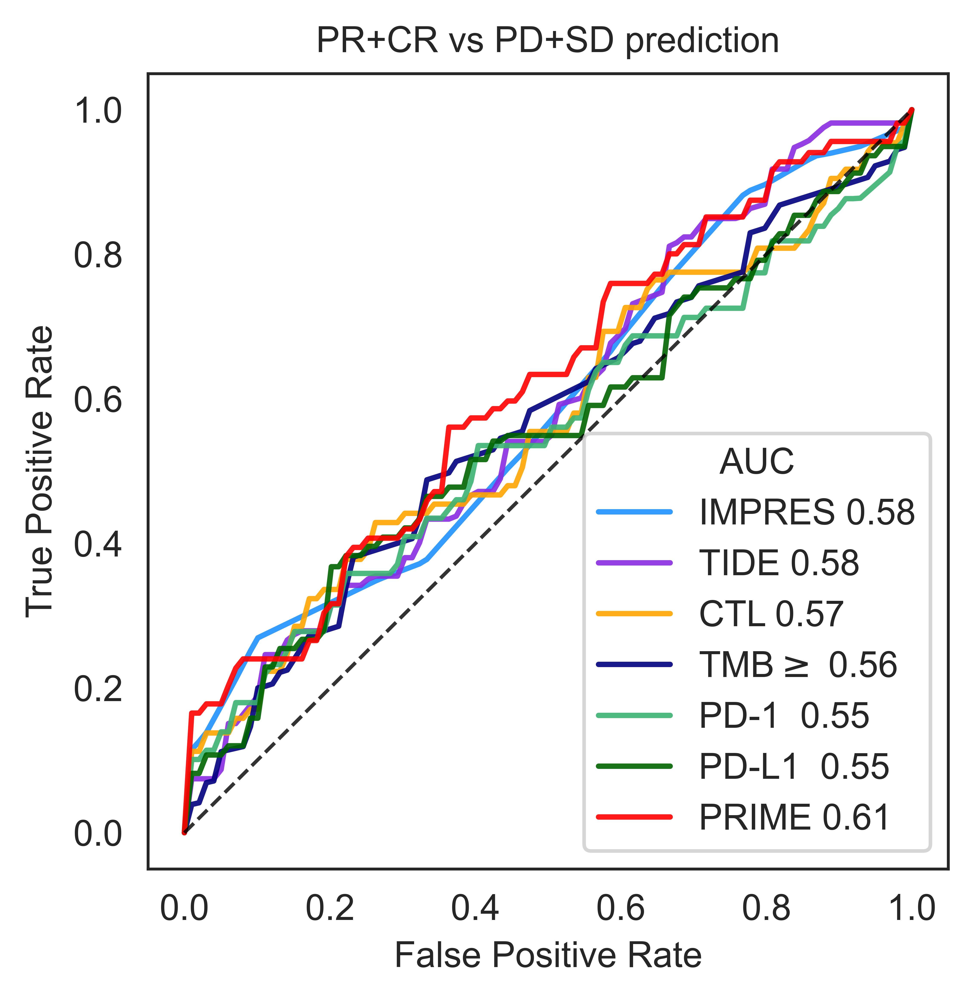

,Acc train,Acc test,Precision,Recall,AUROC,Delta AUROC
CTL,0.603787,0.594449,0.345128,0.495912,0.568204,0.104884
IMPRES,0.570571,0.506730,0.181982,0.523392,0.583518,0.104298
TIDE,0.602864,0.635179,0.297302,0.636667,0.581797,0.109044
TMB,0.549458,0.570699,0.145652,0.155789,0.564948,0.119779
PRIME,0.659215,0.591484,0.475563,0.520563,0.614095,0.110385
PD1,0.572973,0.570859,0.286432,0.515942,0.548298,0.093787
PDL1,0.625208,0.587937,0.322519,0.566667,0.553911,0.097171
CTL+TMB,0.611137,0.622216,0.375563,0.531579,0.601897,0.117060
PRIME+CTL,0.676831,0.641238,0.541867,0.602421,0.619874,0.114470
PRIME+TMB,0.675997,0.624787,0.525563,0.564725,0.624991,0.113345


In [87]:
# Another summary statistic: Test model in each cohort separately with the other cohorts acting as training data. 
# The averaged results are weighted by the number of patients in each cohort, in that the average is by patient, not by cohort.
sns.set_style("white")

IRS = irs.values.T[0]
data = tpm_bc

#1.
tide_scores = tide_df['TIDE'].values
tide_scores = -tide_scores.reshape(-1,1)

#2.
IMPRES_scores = IMPRES_scores.reshape(-1,1)

#3.
ctlDF = compute_ctl_score(tpm_bc)
CTL = np.log2(1+ctlDF.values)


#4.
#Whether or not to include patients without tmb data
include_tmb_not_measured_in_training = True

TMB =TMB_aux

#6.    
PRIME = (weights.reshape(-1,1).T)*np.log2(1+data.loc[gsp_psp_stats.index.values]).T.values.astype(float)
PRIME =  PRIME[:,np.nonzero(np.sum(PRIME, axis=0))[0]]


#7.
SGpd1 = np.log2(1+tpm_bc.loc[['PDCD1'] ].T.values.astype(float)).reshape(-1,1)

#8.
SGpdl1 = np.log2(1+tpm_bc.loc[['CD274']].T.values.astype(float)).reshape(-1,1)

# Apply standard scaling to all data
CTL = (CTL - np.mean(CTL))/np.std(CTL)
PRIME = (PRIME - np.mean(PRIME))/np.std(PRIME)
TMB = (TMB - np.mean(TMB))/np.std(TMB)

SGpd1 = (SGpd1 - np.mean(SGpd1))/np.std(SGpd1)
SGpdl1 = (SGpdl1 - np.mean(SGpdl1))/np.std(SGpdl1)

IMPRES = (IMPRES - np.mean(IMPRES))/np.std(IMPRES)

TIDE = (tide_scores - np.mean(tide_scores))/np.std(tide_scores)

## ML Using iRECIST score (IRS>2 response, IRS>1 DC)
C, I, T, M, S, ST, PD1, PDL1, y = CTL, IMPRES, TIDE, TMB, PRIME, PRIME+TMB, SGpd1, SGpdl1, (IRS>2).astype(int)


random_state = np.random.RandomState(0)
# n_samples, n_features = X.shape
n_classes = len(np.unique(y))


tprsC = []

tprsI = []
tprsT = []

tprsP = []
tprsM = []
tprsCM = []


tprsS = []
tprsCS = []
tprsMS = []
tprsCMS = []

tprsPD1 = []
tprsPDL1 = []

mean_fpr = np.linspace(0, 1, 100)

# Test sets
sets = np.array([3,5,6,7,8])
# sets = np.array([1,2,4]) #This was the 'training set', i.e. the DEA set
n_all_test_pt = len(np.where(np.isin(batch_inds,sets))[0])

N_splits=len(sets)
N_repeats=1
N_models = 11

acc_train=np.zeros((N_models,N_splits*N_repeats)) 
acc_test=np.zeros((N_models,N_splits*N_repeats))
precision=np.zeros((N_models,N_splits*N_repeats))
recall=np.zeros((N_models,N_splits*N_repeats))
auc = np.zeros((N_models,N_splits*N_repeats))

for i in np.arange(len(sets)):
# for i in np.arange(N_splits):

    test_idx = sets[i]
    test_inds = np.where(batch_inds==test_idx)[0]
    train_inds = np.where((batch_inds<9)&(batch_inds!=test_idx))[0]
    
    # test_inds = test_set2
    # train_inds = np.where((batch_inds<9)&(batch_inds!=test_idx))[0]

    if (include_tmb_not_measured_in_training==False):
    
        train_inds = np.intersect1d(tmb_measured, train_inds)

                             
    ###########################                             
    
    C_train = C[train_inds,:]
    C_test = C[test_inds,:]
    
    I_train = I[train_inds,:]
    I_test = I[test_inds,:]
    
    T_train = T[train_inds,:]
    T_test = T[test_inds,:]
    
    M_train = M[train_inds,:]
    M_test = M[test_inds,:]
    
    S_train = S[train_inds,:]
    S_test = S[test_inds,:]

    PD1_train = PD1[train_inds,:]
    PD1_test = PD1[test_inds,:]

    PDL1_train = PDL1[train_inds,:]
    PDL1_test = PDL1[test_inds,:]

    # Combinations
    CM_train = np.hstack((C_train, M_train))
    CM_test = np.hstack((C_test, M_test))

    CS_train = np.hstack((C_train, S_train))
    CS_test = np.hstack((C_test, S_test))
    
    MS_train = np.hstack((M_train, S_train))
    MS_test = np.hstack((M_test, S_test))
    
    CMS_train = np.hstack((C_train, M_train, S_train))
    CMS_test = np.hstack((C_test, M_test, S_test))

   
    y_train= y[train_inds]
    y_test= y[test_inds]

    # print(np.sum(y_test))
    
       ####### CTL ########
    reg_C=0.000001
    model_C = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_C, max_iter=100000)
    
    # Fit classifier to CTL data
    model_C.fit(C_train, y_train)
    
    # Make predictions
    predictions_C = model_C.predict(C_test)
    probs_C = model_C.predict_proba(C_test)
    
    # Calculate metrics
    acc_train[0,i] = model_C.score(C_train, y_train)
    acc_test[0,i] = accuracy_score(predictions_C, y_test)
    precision[0,i] = precision_score(predictions_C, y_test)
    recall[0,i] = recall_score(predictions_C, y_test) 
    auc[0,i] = roc_auc_score(y_test, probs_C[:,1])
    
    fpr_C, tpr_C, _ = roc_curve(y_test, probs_C[:,1])
    
    interp_tpr_C = np.interp(mean_fpr, fpr_C, len(test_inds)*tpr_C/n_all_test_pt)
    interp_tpr_C[0] = 0.0
    tprsC.append(interp_tpr_C)
    
     ####### IMPRES ########
    reg_I=0.000001
    model_I = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_I, max_iter=100000)
    
    # Fit classifier to IMPRES data
    model_I.fit(I_train, y_train)
    
    # Make predictions
    predictions_I = model_I.predict(I_test)
    probs_I = model_I.predict_proba(I_test)
    
    # Calculate metrics
    acc_train[1,i] = model_I.score(I_train, y_train)
    acc_test[1,i] = accuracy_score(predictions_I, y_test)
    precision[1,i] = precision_score(predictions_I, y_test)
    recall[1,i] = recall_score(predictions_I, y_test) 
    auc[1,i] = roc_auc_score(y_test, probs_I[:,1])
    
    fpr_I, tpr_I, _ = roc_curve(y_test, probs_I[:,1])
    
    interp_tpr_I = np.interp(mean_fpr, fpr_I, len(test_inds)*tpr_I/n_all_test_pt)
    interp_tpr_I[0] = 0.0
    tprsI.append(interp_tpr_I)
    
    
    ####### TIDE ########
    reg_T=0.000001
    model_T = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_T, max_iter=100000)
    
    # Fit classifier to TTL data
    model_T.fit(T_train, y_train)
    
    # Make predictions
    predictions_T = model_T.predict(T_test)
    probs_T = model_T.predict_proba(T_test)
    
    # Calculate metrics
    acc_train[2,i] = model_T.score(T_train, y_train)
    acc_test[2,i] = accuracy_score(predictions_T, y_test)
    precision[2,i] = precision_score(predictions_T, y_test)
    recall[2,i] = recall_score(predictions_T, y_test) 
    auc[2,i] = roc_auc_score(y_test, probs_T[:,1])
    
    fpr_T, tpr_T, _ = roc_curve(y_test, probs_T[:,1])
    
    interp_tpr_T = np.interp(mean_fpr, fpr_T, len(test_inds)*tpr_T/n_all_test_pt)
    interp_tpr_T[0] = 0.0
    tprsT.append(interp_tpr_T)
    
    
    ####### TMB ########
    reg_M = 0.00001
    model_M = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_M, max_iter=100000)
    # Fit classifier
    model_M.fit(M_train, y_train)
    
    # Make predictions
    predictions_M = model_M.predict(M_test)
    probs_M = model_M.predict_proba(M_test)
    
    # Calculate metrics
    acc_train[3,i] = model_M.score(M_train, y_train)
    acc_test[3,i] = accuracy_score(predictions_M, y_test)
    precision[3,i] = precision_score(predictions_M, y_test)
    recall[3,i] = recall_score(predictions_M, y_test) 
    auc[3,i] = roc_auc_score(y_test, probs_M[:,1])
    
    fpr_M, tpr_M, _ = roc_curve(y_test, probs_M[:,1])
    
    
    interp_tpr_M = np.interp(mean_fpr, fpr_M, len(test_inds)*tpr_M/n_all_test_pt)
    interp_tpr_M[0] = 0.0
    tprsM.append(interp_tpr_M)
    
    
    ####### Selected genes ########
    
    reg_S = 0.000001
    model_S = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_S, max_iter=100000)
    model_S.fit(S_train, y_train)
    
    # M§ake predictions
    predictions_S = model_S.predict(S_test)
    probs_S = model_S.predict_proba(S_test)
    
    # Calculate metrics
    acc_train[4,i]= model_S.score(S_train, y_train)
    acc_test[4,i] = accuracy_score(predictions_S, y_test)
    precision[4,i] = precision_score(predictions_S, y_test)
    recall[4,i] = recall_score(predictions_S, y_test)
    auc[4,i] = roc_auc_score(y_test, probs_S[:,1])
    
    fpr_S, tpr_S, _ = roc_curve(y_test, probs_S[:,1])
    
    
    interp_tpr_S = np.interp(mean_fpr, fpr_S, len(test_inds)*tpr_S/n_all_test_pt)
    interp_tpr_S[0] = 0.0
    tprsS.append(interp_tpr_S)

    ####### PD1 ########
    
    reg_PD1 = 0.000001
    model_PD1 = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_PD1, max_iter=100000)
    model_PD1.fit(PD1_train, y_train)
    
    # M§ake predictions
    predictions_PD1 = model_PD1.predict(PD1_test)
    probs_PD1 = model_PD1.predict_proba(PD1_test)
    
    # Calculate metrics
    acc_train[5,i]= model_PD1.score(PD1_train, y_train)
    acc_test[5,i] = accuracy_score(predictions_PD1, y_test)
    precision[5,i] = precision_score(predictions_PD1, y_test)
    recall[5,i] = recall_score(predictions_PD1, y_test)
    auc[5,i] = roc_auc_score(y_test, probs_PD1[:,1])
    
    fpr_PD1, tpr_PD1, _ = roc_curve(y_test, probs_PD1[:,1])
    
    
    interp_tpr_PD1 = np.interp(mean_fpr, fpr_PD1, len(test_inds)*tpr_PD1/n_all_test_pt)
    interp_tpr_PD1[0] = 0.0
    tprsPD1.append(interp_tpr_PD1)

    ####### PDL1 ########
    
    reg_PDL1 = 0.000001
    model_PDL1 = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_PDL1, max_iter=100000)
    model_PDL1.fit(PDL1_train, y_train)
    
    # M§ake predictions
    predictions_PDL1 = model_PDL1.predict(PDL1_test)
    probs_PDL1 = model_PDL1.predict_proba(PDL1_test)
    
    # Calculate metrics
    acc_train[6,i]= model_PDL1.score(PDL1_train, y_train)
    acc_test[6,i] = accuracy_score(predictions_PDL1, y_test)
    precision[6,i] = precision_score(predictions_PDL1, y_test)
    recall[6,i] = recall_score(predictions_PDL1, y_test)
    auc[6,i] = roc_auc_score(y_test, probs_PDL1[:,1])
    
    fpr_PDL1, tpr_PDL1, _ = roc_curve(y_test, probs_PDL1[:,1])
    
    
    interp_tpr_PDL1 = np.interp(mean_fpr, fpr_PDL1, len(test_inds)*tpr_PDL1/n_all_test_pt)
    interp_tpr_PDL1[0] = 0.0
    tprsPDL1.append(interp_tpr_PDL1)
    
    ## CM ##
    
    reg_CM=0.000001
    model_CM = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_CM, max_iter=100000)
    
    # Fit classifier to CTL data
    model_CM.fit(CM_train, y_train)
    
    # Make predictions
    predictions_CM = model_CM.predict(CM_test)
    probs_CM = model_CM.predict_proba(CM_test)
    
    # Calculate metrics
    acc_train[7,i] = model_CM.score(CM_train, y_train)
    acc_test[7,i] = accuracy_score(predictions_CM, y_test)
    precision[7,i] = precision_score(predictions_CM, y_test)
    recall[7,i] = recall_score(predictions_CM, y_test) 
    auc[7,i] = roc_auc_score(y_test, probs_CM[:,1])
    
    fpr_CM, tpr_CM, _ = roc_curve(y_test, probs_CM[:,1])
    
    interp_tpr_CM = np.interp(mean_fpr, fpr_CM, len(test_inds)*tpr_CM/n_all_test_pt)
    interp_tpr_CM[0] = 0.0
    tprsCM.append(interp_tpr_CM)
    
    
    ## CS ##
    reg_CS = 0.000001
    model_CS = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_CS, max_iter=100000)
    #     Fit classifier to XPR data
    model_CS.fit(CS_train, y_train)
    
    # Make predictions
    predictions_CS = model_CS.predict(CS_test)
    probs_CS = model_CS.predict_proba(CS_test)
    
    # Calculate metrics
    acc_train[8,i]= model_CS.score(CS_train, y_train)
    acc_test[8,i] = accuracy_score(predictions_CS, y_test)
    precision[8,i] = precision_score(predictions_CS, y_test)
    recall[8,i] = recall_score(predictions_CS, y_test)
    auc[8,i] = roc_auc_score(y_test, probs_CS[:,1])
    
    fpr_CS, tpr_CS, _ = roc_curve(y_test, probs_CS[:,1])
    
    interp_tpr_CS = np.interp(mean_fpr, fpr_CS, len(test_inds)*tpr_CS/n_all_test_pt)
    interp_tpr_CS[0] = 0.0
    tprsCS.append(interp_tpr_CS)
    
    ## MS ##
    reg_MS = reg_S = 0.000001
    model_MS = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_MS, max_iter=100000)
    model_MS.fit(MS_train, y_train)
    
    # Make predictions
    predictions_MS = model_MS.predict(MS_test)
    probs_MS = model_MS.predict_proba(MS_test)
    
    # Calculate metrics
    acc_train[9,i]= model_MS.score(MS_train, y_train)
    acc_test[9,i] = accuracy_score(predictions_MS, y_test)
    precision[9,i] = precision_score(predictions_MS, y_test)
    recall[9,i] = recall_score(predictions_MS, y_test)
    auc[9,i] = roc_auc_score(y_test, probs_MS[:,1])
    
    fpr_MS, tpr_MS, _ = roc_curve(y_test, probs_MS[:,1])
    
    interp_tpr_MS = np.interp(mean_fpr, fpr_MS, len(test_inds)*tpr_MS/n_all_test_pt)
    interp_tpr_MS[0] = 0.0
    tprsMS.append(interp_tpr_MS)
    
    
    ## CMS ##
    
    reg_CMS = 0.000001
    model_CMS = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_CMS, max_iter=100000)
    #     Fit classifier to XPR data
    model_CMS.fit(CMS_train, y_train)
    
    # Make predictions
    predictions_CMS = model_CMS.predict(CMS_test)
    probs_CMS = model_CMS.predict_proba(CMS_test)
    
    # Calculate metrics
    acc_train[10,i]= model_CMS.score(CMS_train, y_train)
    acc_test[10,i] = accuracy_score(predictions_CMS, y_test)
    precision[10,i] = precision_score(predictions_CMS, y_test)
    recall[10,i] = recall_score(predictions_CMS, y_test)
    auc[10,i] = roc_auc_score(y_test, probs_CMS[:,1])
    
    fpr_CMS, tpr_CMS, _ = roc_curve(y_test, len(test_inds)*probs_CMS[:,1]/n_all_test_pt)
        
    interp_tpr_CMS = np.interp(mean_fpr, fpr_CMS, tpr_CMS)
    interp_tpr_CMS[0] = 0.0
    tprsCMS.append(interp_tpr_CMS)
    
    auc[:,i]  = len(test_inds)*auc[:,i]/len(np.where(np.isin(batch_inds,sets))[0])


mean_tprC = np.sum(tprsC, axis=0)
mean_tprC[-1] = 1.0

mean_tprI = np.sum(tprsI, axis=0)
mean_tprI[-1] = 1.0

mean_tprT = np.sum(tprsT, axis=0)
mean_tprT[-1] = 1.0

mean_tprS = np.sum(tprsS, axis=0)
mean_tprS[-1] = 1.0

mean_tprM = np.sum(tprsM, axis=0)
mean_tprM[-1] = 1.0

mean_tprPD1 = np.sum(tprsPD1, axis=0)
mean_tprPD1[-1] = 1.0

mean_tprPDL1 = np.sum(tprsPDL1, axis=0)
mean_tprPDL1[-1] = 1.0

mean_tprCM = np.sum(tprsCM, axis=0)
mean_tprCM[-1] = 1.0

mean_tprCS = np.sum(tprsCS, axis=0)
mean_tprCS[-1] = 1.0

mean_tprMS = np.sum(tprsMS, axis=0)
mean_tprMS[-1] = 1.0

mean_tprCMS = np.sum(tprsCMS, axis=0)
mean_tprCMS[-1] = 1.0


#plot the roc curves 
plt.figure(figsize=(4,4), dpi=1200)


# plt.plot(mean_fpr, mean_tprI, marker=None, alpha=0.9, linewidth=1.5, color='indigo',label=r"IMPRES %0.2f" % np.sum(auc[1,:]))

# plt.plot(mean_fpr, mean_tprT, marker=None, alpha=0.9, linewidth=1.5, color='teal',label=r"Tide %0.2f" % np.sum(auc[2,:]))

# plt.plot(mean_fpr, mean_tprC, marker=None, alpha=0.9, linewidth=1.5,color='orange',label=r"CTL %0.2f" % np.sum(auc[0,:]))

# plt.plot(mean_fpr, mean_tprM, marker=None, alpha=0.9, linewidth=1.5, color='grey',label=r"TMB %0.2f" % np.sum(auc[3,:]))

# plt.plot(mean_fpr, mean_tprPD1, marker=None, alpha=0.9, linewidth=1.5, color='dodgerblue',label=r"PD-1  %0.2f" % np.sum(auc[5,:]))

# plt.plot(mean_fpr, mean_tprPDL1, marker=None, alpha=0.9, linewidth=1.5, color='blue',label=r"PD-L1  %0.2f" % np.sum(auc[6,:]))

# # plt.plot(mean_fpr, mean_tprCM, marker=None, alpha=0.9, linewidth=1.5, color='coral',label=r"CTL+TMB %0.2f" % np.sum(auc[7,:]))

# plt.plot(mean_fpr, mean_tprS, marker=None, alpha=0.9, linewidth=1.5, color='red',label=r"Prime %0.2f" % np.sum(auc[4,:]))

# # plt.plot(mean_fpr, mean_tprCS, marker=None, alpha=0.9, linewidth=1.5, color='darkred',label=r"PRIME+CTL  %0.2f" % np.mean(auc[8,:]))

# plt.plot(mean_fpr, mean_tprMS, marker=None, alpha=0.9, linewidth=1.5, color='orchid',label=r"Prime+TMB  %0.2f" % np.sum(auc[9,:]))

plt.plot(mean_fpr, mean_tprI, marker=None, alpha=0.9, linewidth=1.5, color='dodgerblue',label=r"IMPRES %0.2f" % np.sum(auc[1,:]))
plt.plot(mean_fpr, mean_tprT, marker=None, alpha=0.9, linewidth=1.5, color='blueviolet',label=r"TIDE %0.2f" % np.sum(auc[2,:]))
plt.plot(mean_fpr, mean_tprC, marker=None, alpha=0.9, linewidth=1.5,color='orange',label=r"CTL %0.2f" % np.sum(auc[0,:]))
plt.plot(mean_fpr, mean_tprM, marker=None, alpha=0.9, linewidth=1.5, color='navy',label=r"TMB$\geq$ %0.2f" % np.sum(auc[3,:]))
plt.plot(mean_fpr, mean_tprPD1, marker=None, alpha=0.9, linewidth=1.5, color='mediumseagreen',label=r"PD-1  %0.2f" % np.sum(auc[5,:]))
plt.plot(mean_fpr, mean_tprPDL1, marker=None, alpha=0.9, linewidth=1.5, color='darkgreen',label=r"PD-L1  %0.2f" % np.sum(auc[6,:]))
plt.plot(mean_fpr, mean_tprS, marker=None, alpha=0.9, linewidth=1.5, color='red',label=r"PRIME %0.2f" % np.sum(auc[4,:]))

# plt.plot(mean_fpr, mean_tprCS, marker=None, alpha=0.9, linewidth=1.5, color='darkred',label=r"Prime+CTL  %0.2f" % np.sum(auc[8,:]))
# plt.plot(mean_fpr, mean_tprMS, marker=None, alpha=0.9, linewidth=1.5, color='orchid',label=r"Prime+TMB  %0.2f" % np.sum(auc[9,:]))

plt.plot([0, 1], [0, 1], "k--", alpha = 0.8, linewidth=1)

leg = plt.legend(title= 'AUC', loc='lower right')
for t in leg.get_texts():
    t.set_ha('right')

# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# plt.title('PR+CR vs PD+SD')

plt.title('PR+CR vs PD+SD prediction', fontsize='medium')

filename = 'logistic_regression_roc_summary_test_in_each_cohort_no_repeats.pdf'
plt.savefig(filename)

plt.show()

df_model = pd.DataFrame(index=['CTL','IMPRES', 'TIDE', 'TMB', 'PRIME', 'PD1','PDL1','CTL+TMB', 'PRIME+CTL', 'PRIME+TMB','PRIME+CTL+TMB'], columns=['Acc train', 'Acc test','Precision', 'Recall', 'AUROC', 'Delta AUROC'])
df_model['Acc train'] = np.mean(acc_train,axis=1)
df_model['Acc test'] = np.mean(acc_test,axis=1)
df_model['Precision'] = np.mean(precision,axis=1)
df_model['Recall'] = np.mean(recall,axis=1)
df_model['AUROC'] = np.sum(auc,axis=1)
df_model['Delta AUROC'] = np.std(auc,axis=1)

df_model.loc[['CTL','IMPRES', 'TIDE',  'TMB', 'PRIME', 'PD1', 'PDL1', 'CTL+TMB', 'PRIME+CTL', 'PRIME+TMB','PRIME+CTL+TMB' ]]
# df_model


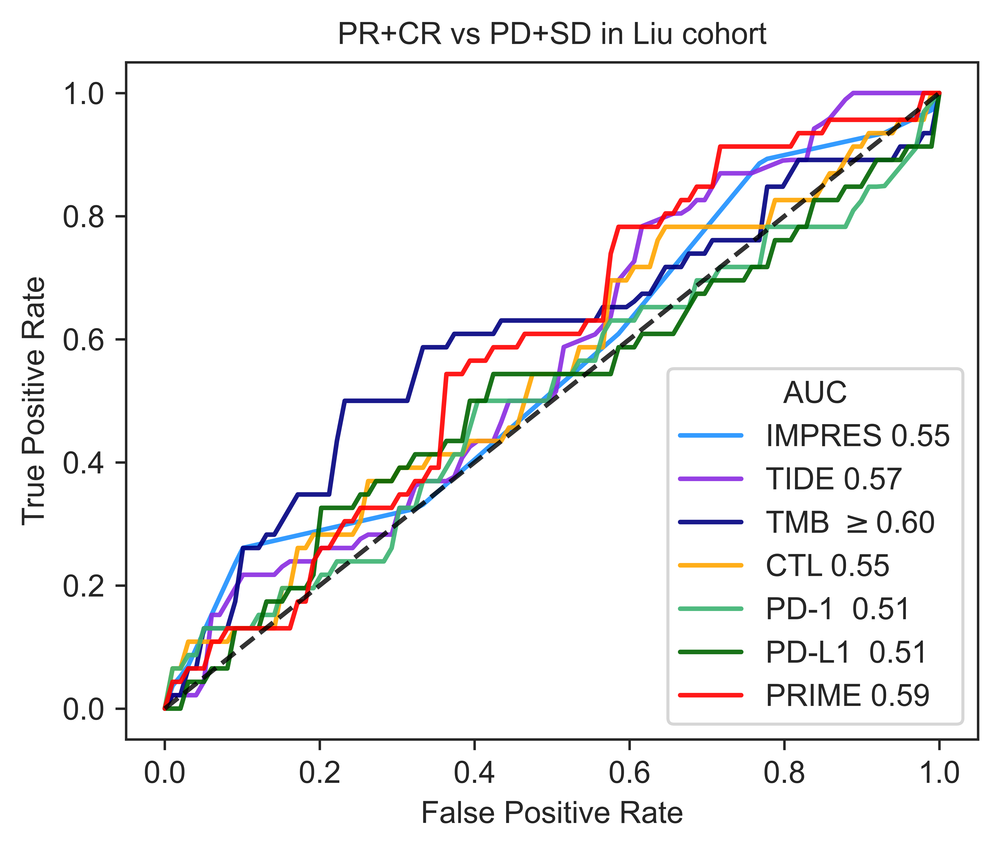

/Users/oipulk/miniconda3/envs/py3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


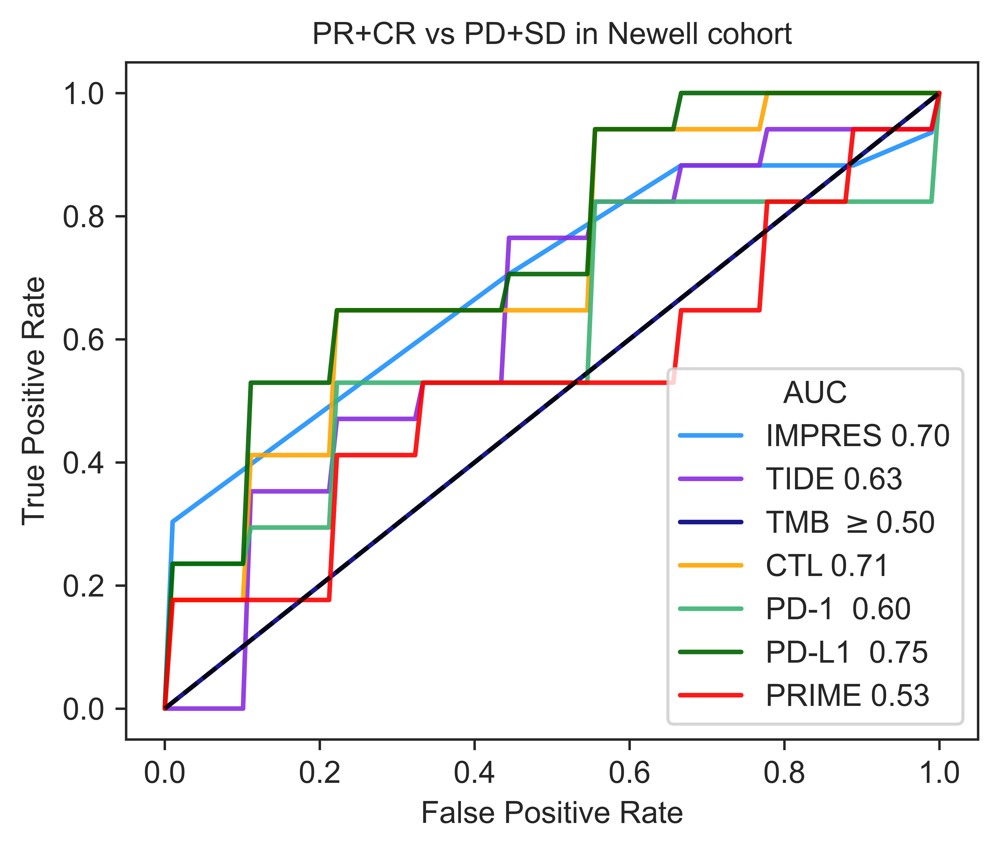

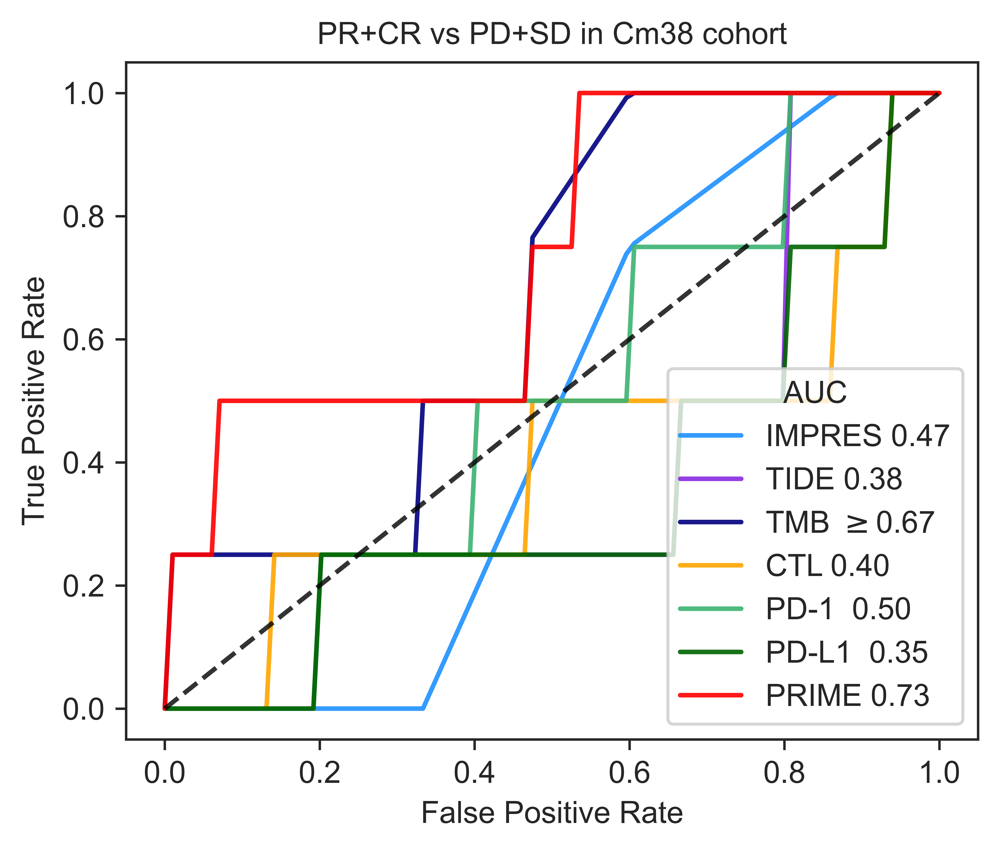

/Users/oipulk/miniconda3/envs/py3/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


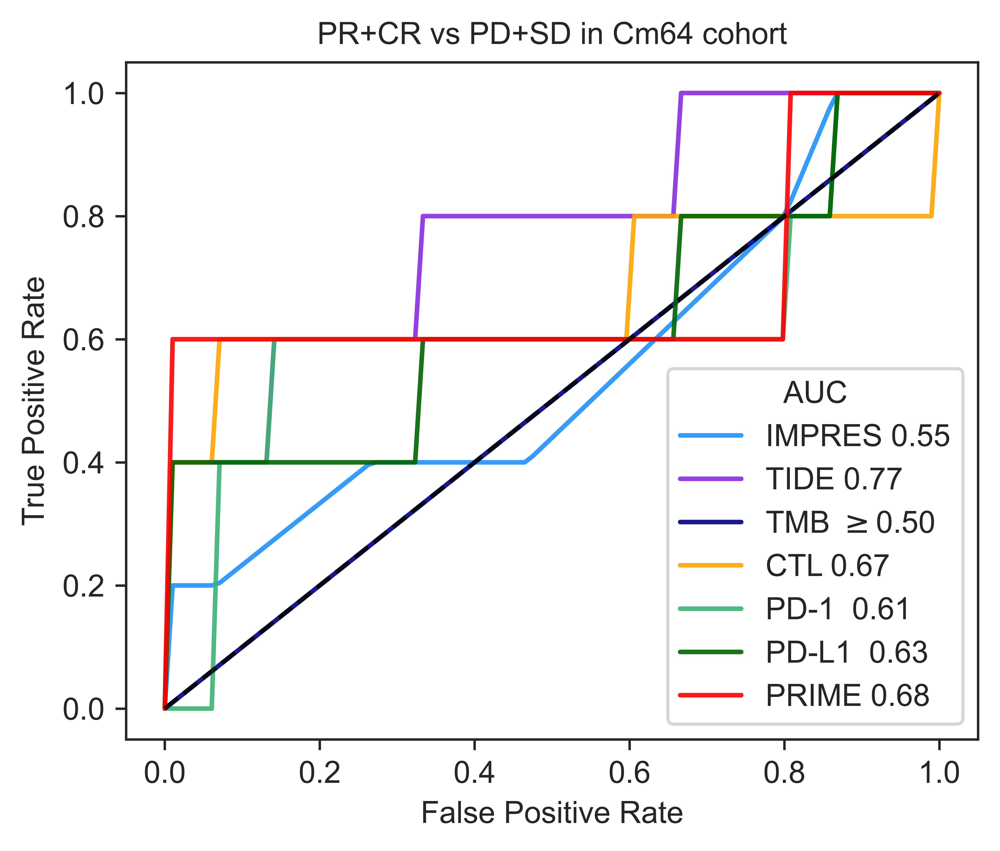

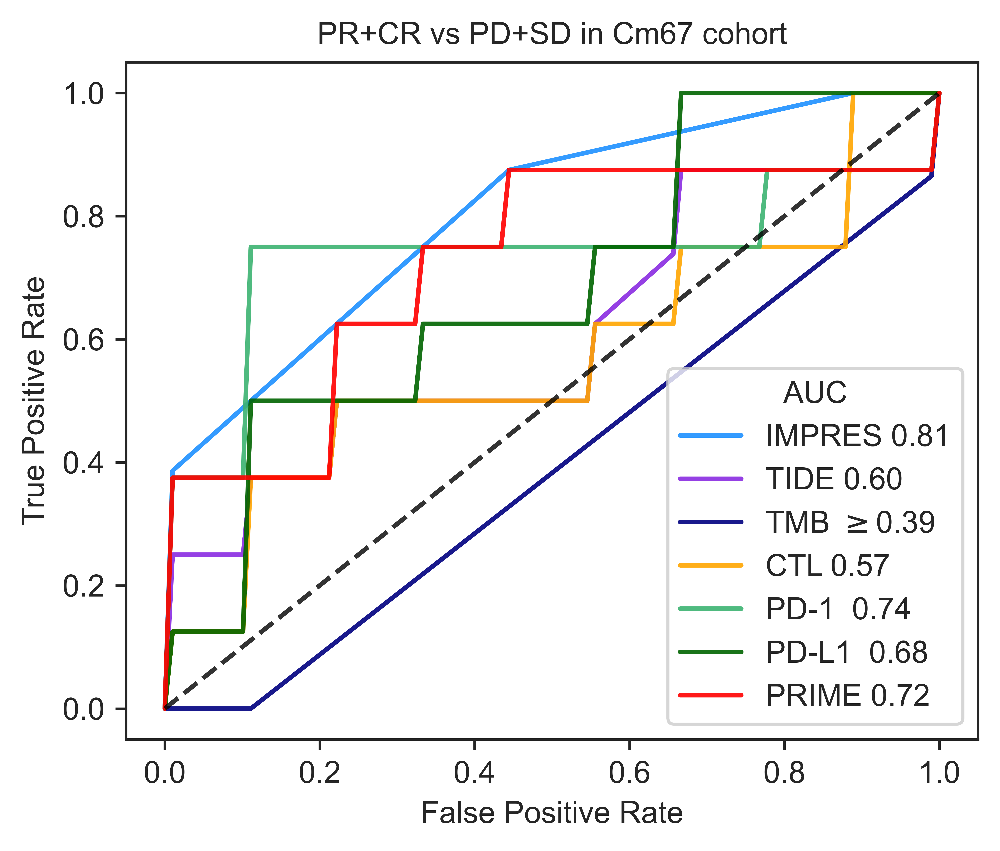

In [83]:
# Tests in individual cohorts. Results are not averaged but shown for each cohort.
sns.set_style("ticks")

IRS = irs.values.T[0]
data = tpm_bc

#1.
tide_scores = tide_df['TIDE'].values
tide_scores = -tide_scores.reshape(-1,1)

#2.
IMPRES = -IMPRES_scores.reshape(-1,1)

#3.
ctlDF = compute_ctl_score(tpm_bc)
CTL = np.log2(1+ctlDF.values)


#4.
#Whether or not to include patients without tmb data
include_tmb_not_measured_in_training = True

TMB =TMB_aux

#6.    
PRIME = (weights.reshape(-1,1).T)*np.log2(1+data.loc[gsp_psp_stats.index.values]).T.values.astype(float)
PRIME =  PRIME[:,np.nonzero(np.sum(PRIME, axis=0))[0]]


#7.
SGpd1 = np.log2(1+tpm_bc.loc[['PDCD1'] ].T.values.astype(float)).reshape(-1,1)

#8.
SGpdl1 = np.log2(1+tpm_bc.loc[['CD274']].T.values.astype(float)).reshape(-1,1)

# Apply standard scaling to all data
CTL = (CTL - np.mean(CTL))/np.std(CTL)
PRIME = (PRIME - np.mean(PRIME))/np.std(PRIME)
TMB = (TMB - np.mean(TMB))/np.std(TMB)

SGpd1 = (SGpd1 - np.mean(SGpd1))/np.std(SGpd1)
SGpdl1 = (SGpdl1 - np.mean(SGpdl1))/np.std(SGpdl1)


IMPRES = (IMPRES - np.mean(IMPRES))/np.std(IMPRES)

TIDE = (tide_scores - np.mean(tide_scores))/np.std(tide_scores)

## ML Using iRECIST score (IRS>2 response, IRS>1 DC)
C, I, T, M, S, ST, PD1, PDL1, y = CTL, IMPRES, TIDE, TMB, PRIME, PRIME+TMB, SGpd1, SGpdl1, (IRS>2).astype(int)


random_state = np.random.RandomState(0)
n_classes = len(np.unique(y))

sets = np.array([3,5,6,7,8])

for i in np.arange(len(sets)):


    test_idx = sets[i]
    test_inds = np.where(batch_inds==test_idx)[0]
    train_inds = np.where((batch_inds<9)&(batch_inds!=test_idx))[0]

    cohort = cohort_names[test_idx-1]
   
    if (include_tmb_not_measured_in_training==False):
    
        train_inds = np.intersect1d(tmb_measured, train_inds)


    tprsC = []

    tprsI = []
    tprsT = []
    
    tprsG = []
    tprsP = []
    tprsM = []
    tprsCM = []
    
    
    tprsS = []
    tprsCS = []
    tprsMS = []
    tprsCMS = []
    
    tprsPD1 = []
    tprsPDL1 = []
    
    mean_fpr = np.linspace(0, 1, 100)
    
    N_splits=1
    N_repeats=1
    N_models = 11

    acc_train=np.zeros((N_models,N_splits*N_repeats)) 
    acc_test=np.zeros((N_models,N_splits*N_repeats))
    precision=np.zeros((N_models,N_splits*N_repeats))
    recall=np.zeros((N_models,N_splits*N_repeats))
    auc = np.zeros((N_models,N_splits*N_repeats))

    i=0
    ###########################                             
    
    C_train = C[train_inds,:]
    C_test = C[test_inds,:]
    
    I_train = I[train_inds,:]
    I_test = I[test_inds,:]
    
    T_train = T[train_inds,:]
    T_test = T[test_inds,:]
    
    M_train = M[train_inds,:]
    M_test = M[test_inds,:]
    
    S_train = S[train_inds,:]
    S_test = S[test_inds,:]

    PD1_train = PD1[train_inds,:]
    PD1_test = PD1[test_inds,:]

    PDL1_train = PDL1[train_inds,:]
    PDL1_test = PDL1[test_inds,:]

    # Combinations
    CM_train = np.hstack((C_train, M_train))
    CM_test = np.hstack((C_test, M_test))

    CS_train = np.hstack((C_train, S_train))
    CS_test = np.hstack((C_test, S_test))
    
    MS_train = np.hstack((M_train, S_train))
    MS_test = np.hstack((M_test, S_test))
    
    CMS_train = np.hstack((C_train, M_train, S_train))
    CMS_test = np.hstack((C_test, M_test, S_test))

   
    y_train= y[train_inds]
    y_test= y[test_inds]
    
    
       ####### CTL ########
    reg_C=0.000001
    model_C = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_C, max_iter=100000)
    
    # Fit classifier to CTL data
    model_C.fit(C_train, y_train)
    
    # Make predictions
    predictions_C = model_C.predict(C_test)
    probs_C = model_C.predict_proba(C_test)
    
    # Calculate metrics
    acc_train[0,i] = model_C.score(C_train, y_train)
    acc_test[0,i] = accuracy_score(predictions_C, y_test)
    precision[0,i] = precision_score(predictions_C, y_test)
    recall[0,i] = recall_score(predictions_C, y_test) 
    auc[0,i] = roc_auc_score(y_test, probs_C[:,1])
    
    fpr_C, tpr_C, _ = roc_curve(y_test, probs_C[:,1])
    
    interp_tpr_C = np.interp(mean_fpr, fpr_C, tpr_C)
    interp_tpr_C[0] = 0.0
    tprsC.append(interp_tpr_C)
    
     ####### IMPRES ########
    reg_I=0.000001
    model_I = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_I, max_iter=100000)
    
    # Fit classifier to IMPRES data
    model_I.fit(I_train, y_train)
    
    # Make predictions
    predictions_I = model_I.predict(I_test)
    probs_I = model_I.predict_proba(I_test)
    
    # Calculate metrics
    acc_train[1,i] = model_I.score(I_train, y_train)
    acc_test[1,i] = accuracy_score(predictions_I, y_test)
    precision[1,i] = precision_score(predictions_I, y_test)
    recall[1,i] = recall_score(predictions_I, y_test) 
    auc[1,i] = roc_auc_score(y_test, probs_I[:,1])
    
    fpr_I, tpr_I, _ = roc_curve(y_test, probs_I[:,1])
    
    interp_tpr_I = np.interp(mean_fpr, fpr_I, tpr_I)
    interp_tpr_I[0] = 0.0
    tprsI.append(interp_tpr_I)
    
    
    ####### TIDE ########
    reg_T=0.000001
    model_T = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_T, max_iter=100000)
    
    # Fit classifier to TTL data
    model_T.fit(T_train, y_train)
    
    # Make predictions
    predictions_T = model_T.predict(T_test)
    probs_T = model_T.predict_proba(T_test)
    
    # Calculate metrics
    acc_train[2,i] = model_T.score(T_train, y_train)
    acc_test[2,i] = accuracy_score(predictions_T, y_test)
    precision[2,i] = precision_score(predictions_T, y_test)
    recall[2,i] = recall_score(predictions_T, y_test) 
    auc[2,i] = roc_auc_score(y_test, probs_T[:,1])
    
    fpr_T, tpr_T, _ = roc_curve(y_test, probs_T[:,1])
    
    interp_tpr_T = np.interp(mean_fpr, fpr_T, tpr_T)
    interp_tpr_T[0] = 0.0
    tprsT.append(interp_tpr_T)
    
    
    ####### TMB ########
    reg_M = 0.00001
    model_M = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_M, max_iter=100000)
    # Fit classifier
    model_M.fit(M_train, y_train)
    
    # Make predictions
    predictions_M = model_M.predict(M_test)
    probs_M = model_M.predict_proba(M_test)
    
    # Calculate metrics
    acc_train[3,i] = model_M.score(M_train, y_train)
    acc_test[3,i] = accuracy_score(predictions_M, y_test)
    precision[3,i] = precision_score(predictions_M, y_test)
    recall[3,i] = recall_score(predictions_M, y_test) 
    auc[3,i] = roc_auc_score(y_test, probs_M[:,1])
    
    fpr_M, tpr_M, _ = roc_curve(y_test, probs_M[:,1])
    
    
    interp_tpr_M = np.interp(mean_fpr, fpr_M, tpr_M)
    interp_tpr_M[0] = 0.0
    tprsM.append(interp_tpr_M)
    
    
    ####### Selected genes ########
    
    reg_S = 0.000001
    model_S = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_S, max_iter=100000)
    model_S.fit(S_train, y_train)
    
    # Make predictions
    predictions_S = model_S.predict(S_test)
    probs_S = model_S.predict_proba(S_test)
    
    # Calculate metrics
    acc_train[4,i]= model_S.score(S_train, y_train)
    acc_test[4,i] = accuracy_score(predictions_S, y_test)
    precision[4,i] = precision_score(predictions_S, y_test)
    recall[4,i] = recall_score(predictions_S, y_test)
    auc[4,i] = roc_auc_score(y_test, probs_S[:,1])
    
    fpr_S, tpr_S, _ = roc_curve(y_test, probs_S[:,1])
    
    
    interp_tpr_S = np.interp(mean_fpr, fpr_S, tpr_S)
    interp_tpr_S[0] = 0.0
    tprsS.append(interp_tpr_S)

    ####### PD1 ########
    
    reg_PD1 = 0.000001
    model_PD1 = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_PD1, max_iter=100000)
    model_PD1.fit(PD1_train, y_train)
    
    # M§ake predictions
    predictions_PD1 = model_PD1.predict(PD1_test)
    probs_PD1 = model_PD1.predict_proba(PD1_test)
    
    # Calculate metrics
    acc_train[5,i]= model_PD1.score(PD1_train, y_train)
    acc_test[5,i] = accuracy_score(predictions_PD1, y_test)
    precision[5,i] = precision_score(predictions_PD1, y_test)
    recall[5,i] = recall_score(predictions_PD1, y_test)
    auc[5,i] = roc_auc_score(y_test, probs_PD1[:,1])
    
    fpr_PD1, tpr_PD1, _ = roc_curve(y_test, probs_PD1[:,1])
    
    
    interp_tpr_PD1 = np.interp(mean_fpr, fpr_PD1, tpr_PD1)
    interp_tpr_PD1[0] = 0.0
    tprsPD1.append(interp_tpr_PD1)

    ####### PDL1 ########
    
    reg_PDL1 = 0.000001
    model_PDL1 = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_PDL1, max_iter=100000)
    model_PDL1.fit(PDL1_train, y_train)
    
    # M§ake predictions
    predictions_PDL1 = model_PDL1.predict(PDL1_test)
    probs_PDL1 = model_PDL1.predict_proba(PDL1_test)
    
    # Calculate metrics
    acc_train[6,i]= model_PDL1.score(PDL1_train, y_train)
    acc_test[6,i] = accuracy_score(predictions_PDL1, y_test)
    precision[6,i] = precision_score(predictions_PDL1, y_test)
    recall[6,i] = recall_score(predictions_PDL1, y_test)
    auc[6,i] = roc_auc_score(y_test, probs_PDL1[:,1])
    
    fpr_PDL1, tpr_PDL1, _ = roc_curve(y_test, probs_PDL1[:,1])
    
    
    interp_tpr_PDL1 = np.interp(mean_fpr, fpr_PDL1, tpr_PDL1)
    interp_tpr_PDL1[0] = 0.0
    tprsPDL1.append(interp_tpr_PDL1)
    
    ## CM ##
    
    reg_CM=0.000001
    model_CM = LogisticRegression(solver= 'liblinear',  penalty = 'l2', C=1/reg_CM, max_iter=100000)
    
    # Fit classifier to CTL data
    model_CM.fit(CM_train, y_train)
    
    # Make predictions
    predictions_CM = model_CM.predict(CM_test)
    probs_CM = model_CM.predict_proba(CM_test)
    
    # Calculate metrics
    acc_train[7,i] = model_CM.score(CM_train, y_train)
    acc_test[7,i] = accuracy_score(predictions_CM, y_test)
    precision[7,i] = precision_score(predictions_CM, y_test)
    recall[7,i] = recall_score(predictions_CM, y_test) 
    auc[7,i] = roc_auc_score(y_test, probs_CM[:,1])
    
    fpr_CM, tpr_CM, _ = roc_curve(y_test, probs_CM[:,1])
    
    interp_tpr_CM = np.interp(mean_fpr, fpr_CM, tpr_CM)
    interp_tpr_CM[0] = 0.0
    tprsCM.append(interp_tpr_CM)
    
    
    ## CS ##
    reg_CS = 0.000001
    model_CS = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_CS, max_iter=100000)
    model_CS.fit(CS_train, y_train)
    
    # Make predictions
    predictions_CS = model_CS.predict(CS_test)
    probs_CS = model_CS.predict_proba(CS_test)
    
    # Calculate metrics
    acc_train[8,i]= model_CS.score(CS_train, y_train)
    acc_test[8,i] = accuracy_score(predictions_CS, y_test)
    precision[8,i] = precision_score(predictions_CS, y_test)
    recall[8,i] = recall_score(predictions_CS, y_test)
    auc[8,i] = roc_auc_score(y_test, probs_CS[:,1])
    
    fpr_CS, tpr_CS, _ = roc_curve(y_test, probs_CS[:,1])
    
    interp_tpr_CS = np.interp(mean_fpr, fpr_CS, tpr_CS)
    interp_tpr_CS[0] = 0.0
    tprsCS.append(interp_tpr_CS)
    
    ## MS ##
    reg_MS = reg_S = 0.000001
    model_MS = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_MS, max_iter=100000)
    model_MS.fit(MS_train, y_train)
    
    # Make predictions
    predictions_MS = model_MS.predict(MS_test)
    probs_MS = model_MS.predict_proba(MS_test)
    
    # Calculate metrics
    acc_train[9,i]= model_MS.score(MS_train, y_train)
    acc_test[9,i] = accuracy_score(predictions_MS, y_test)
    precision[9,i] = precision_score(predictions_MS, y_test)
    recall[9,i] = recall_score(predictions_MS, y_test)
    auc[9,i] = roc_auc_score(y_test, probs_MS[:,1])
    
    fpr_MS, tpr_MS, _ = roc_curve(y_test, probs_MS[:,1])
    
    interp_tpr_MS = np.interp(mean_fpr, fpr_MS, tpr_MS)
    interp_tpr_MS[0] = 0.0
    tprsMS.append(interp_tpr_MS)
    
    
    ## CMS ##
    
    reg_CMS = 0.000001
    model_CMS = LogisticRegression(solver= 'liblinear', penalty = 'l2', C=1/reg_CMS, max_iter=100000)
    #     Fit classifier to XPR data
    model_CMS.fit(CMS_train, y_train)
    
    # Make predictions
    predictions_CMS = model_CMS.predict(CMS_test)
    probs_CMS = model_CMS.predict_proba(CMS_test)
    
    # Calculate metrics
    acc_train[10,i]= model_CMS.score(CMS_train, y_train)
    acc_test[10,i] = accuracy_score(predictions_CMS, y_test)
    precision[10,i] = precision_score(predictions_CMS, y_test)
    recall[10,i] = recall_score(predictions_CMS, y_test)
    auc[10,i] = roc_auc_score(y_test, probs_CMS[:,1])
    
    fpr_CMS, tpr_CMS, _ = roc_curve(y_test, probs_CMS[:,1])
        
    interp_tpr_CMS = np.interp(mean_fpr, fpr_CMS, tpr_CMS)
    interp_tpr_CMS[0] = 0.0
    tprsCMS.append(interp_tpr_CMS)
    
    
    
    
    mean_tprC = np.mean(tprsC, axis=0)
    mean_tprC[-1] = 1.0
    
    mean_tprI = np.mean(tprsI, axis=0)
    mean_tprI[-1] = 1.0
    
    mean_tprT = np.mean(tprsT, axis=0)
    mean_tprT[-1] = 1.0
    
    mean_tprS = np.mean(tprsS, axis=0)
    mean_tprS[-1] = 1.0
    
    mean_tprM = np.mean(tprsM, axis=0)
    mean_tprM[-1] = 1.0
    
    mean_tprPD1 = np.mean(tprsPD1, axis=0)
    mean_tprPD1[-1] = 1.0
    
    mean_tprPDL1 = np.mean(tprsPDL1, axis=0)
    mean_tprPDL1[-1] = 1.0
    
    mean_tprCM = np.mean(tprsCM, axis=0)
    mean_tprCM[-1] = 1.0
    
    mean_tprCS = np.mean(tprsCS, axis=0)
    mean_tprCS[-1] = 1.0
    
    mean_tprMS = np.mean(tprsMS, axis=0)
    mean_tprMS[-1] = 1.0
    
    mean_tprCMS = np.mean(tprsCMS, axis=0)
    mean_tprCMS[-1] = 1.0
    
    
    
    #plot the roc curves 
    plt.figure(figsize=(5,4), dpi=1200)
    
    plt.plot(mean_fpr, mean_tprI, marker=None, alpha=0.9, linewidth=1.5, color='dodgerblue',label=r"IMPRES %0.2f" % np.sum(auc[1,:]))
    plt.plot(mean_fpr, mean_tprT, marker=None, alpha=0.9, linewidth=1.5, color='blueviolet',label=r"TIDE %0.2f" % np.sum(auc[2,:]))
    plt.plot(mean_fpr, mean_tprM, marker=None, alpha=0.9, linewidth=1.5, color='navy',label=r"TMB $\geq$%0.2f" % np.sum(auc[3,:]))
    plt.plot(mean_fpr, mean_tprC, marker=None, alpha=0.9, linewidth=1.5,color='orange',label=r"CTL %0.2f" % np.sum(auc[0,:]))
    plt.plot(mean_fpr, mean_tprPD1, marker=None, alpha=0.9, linewidth=1.5, color='mediumseagreen',label=r"PD-1  %0.2f" % np.sum(auc[5,:]))
    plt.plot(mean_fpr, mean_tprPDL1, marker=None, alpha=0.9, linewidth=1.5, color='darkgreen',label=r"PD-L1  %0.2f" % np.sum(auc[6,:]))
    plt.plot(mean_fpr, mean_tprS, marker=None, alpha=0.9, linewidth=1.5, color='red',label=r"PRIME %0.2f" % np.sum(auc[4,:]))

    # plt.plot(mean_fpr, mean_tprCS, marker=None, alpha=0.9, linewidth=1.5, color='darkred',label=r"Prime+CTL  %0.2f" % np.sum(auc[8,:]))
    # plt.plot(mean_fpr, mean_tprMS, marker=None, alpha=0.9, linewidth=1.5, color='orchid',label=r"Prime+TMB  %0.2f" % np.sum(auc[9,:]))

    
    plt.plot([0, 1], [0, 1], "k--", alpha = 0.8)
    
    leg = plt.legend(title= 'AUC', loc='lower right')
    for t in leg.get_texts():
        t.set_ha('right')
    
    # axis labels
    plt.xlabel('False Positive Rate', fontsize='medium')
    plt.ylabel('True Positive Rate', fontsize='medium')

    plt.title('PR+CR vs PD+SD in ' + cohort + ' cohort', fontsize='medium')

    filename = 'logistic_regressionroc_'+cohort+'.pdf'
    plt.savefig(filename)
    plt.show()
    
    df_model = pd.DataFrame(index=['CTL','IMPRES', 'TIDE', 'TMB', 'PRIME', 'PD1','PDL1','CTL+TMB', 'CTL+Sel', 'TMB+Sel','CTL+TMB+Sel'], columns=['Acc train', 'Acc test','Precision', 'Recall', 'AUROC', 'Delta AUROC'])
    df_model['Acc train'] = np.mean(acc_train,axis=1)
    df_model['Acc test'] = np.mean(acc_test,axis=1)
    df_model['Precision'] = np.mean(precision,axis=1)
    df_model['Recall'] = np.mean(recall,axis=1)
    df_model['AUROC'] = np.mean(auc,axis=1)
    df_model['Delta AUROC'] = np.std(auc,axis=1)
    
    df_model.loc[['CTL','IMPRES', 'TIDE',  'TMB', 'PRIME', 'PD1', 'PDL1', 'CTL+TMB',  'CTL+Sel', 'TMB+Sel','CTL+TMB+Sel' ]]
    # df_model


### Single test without logistic regression using the sum of weighted expression levels as PRIME signature 

In [89]:
from sklearn.metrics import roc_curve, auc

patients in test set: 198


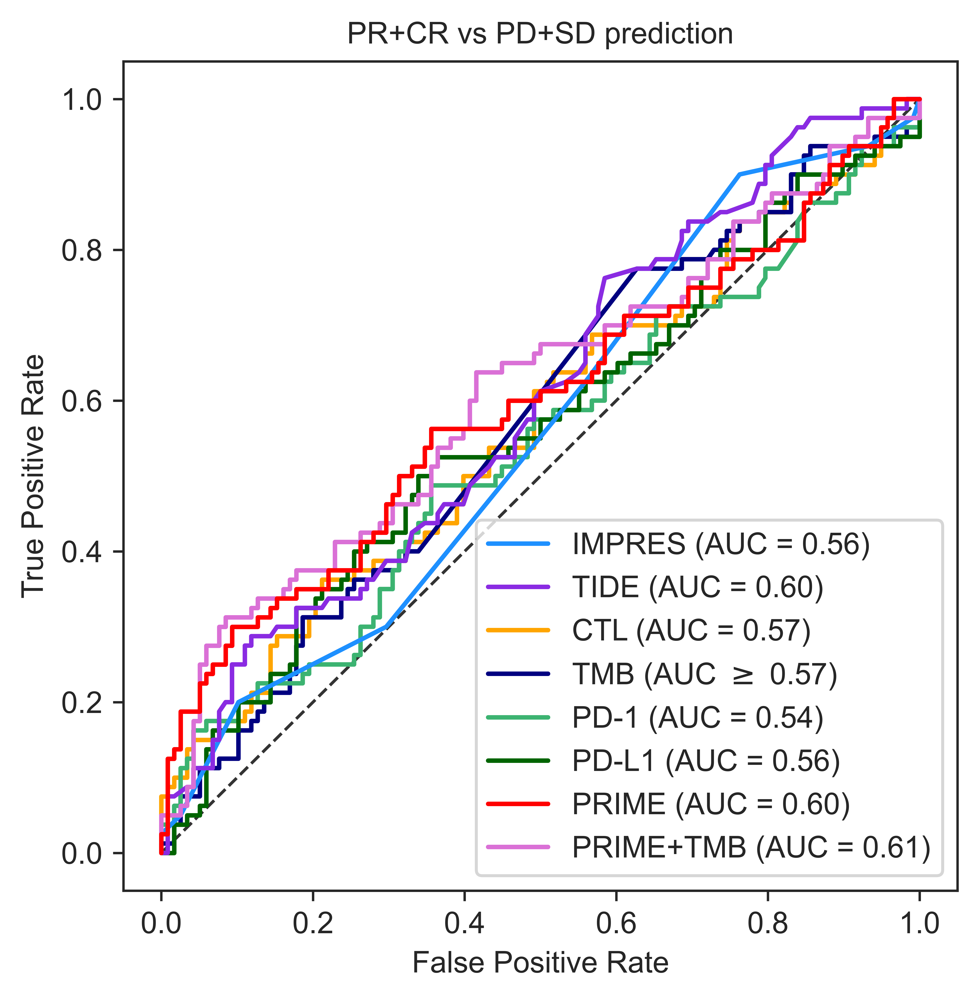

In [85]:

sns.set_style("ticks")

IRS = irs.values.T[0]
data = tpm_bc

#1.
tide_scores = tide_df['TIDE'].values
tide_scores = -tide_scores.reshape(-1,1)

#2.
IMPRES = -IMPRES_scores.reshape(-1,1)

#3.
ctlDF = compute_ctl_score(tpm_bc)
CTL = np.log2(1+ctlDF.values)


#4.
TMB =TMB_aux

#6. Add Prime gene expression multiplied by their weights to obtain a scalarized PRIME score
PRIME_score = np.matmul((weights.reshape(-1,1).T),np.log2(1+data.loc[gsp_psp_stats.index.values]).values.astype(float)).T

#7.
SGpd1 = np.log2(1+tpm_bc.loc[['PDCD1'] ].T.values.astype(float)).reshape(-1,1)

#8.
SGpdl1 = np.log2(1+tpm_bc.loc[['CD274']].T.values.astype(float)).reshape(-1,1)


CTL = (CTL - np.mean(CTL))/np.std(CTL)
PRIME = (PRIME_score - np.mean(PRIME_score))/np.std(PRIME_score)
TMB = (TMB - np.mean(TMB))/np.std(TMB)

SGpd1 = (SGpd1 - np.mean(SGpd1))/np.std(SGpd1)
SGpdl1 = (SGpdl1 - np.mean(SGpdl1))/np.std(SGpdl1)

IMPRES = (IMPRES - np.mean(IMPRES))/np.std(IMPRES)

TIDE = (tide_scores - np.mean(tide_scores))/np.std(tide_scores)

## ML Using iRECIST score (IRS>2 response, IRS>1 DC)
C, I, T, M, S, ST, PD1, PDL1, y = CTL, IMPRES, TIDE, TMB, PRIME_score, PRIME_score+TMB, SGpd1, SGpdl1, (IRS>2).astype(int)


random_state = np.random.RandomState(0)
# n_samples, n_features = X.shape
n_classes = len(np.unique(y))


mean_fpr = np.linspace(0, 1, 100)

test_patients_batch = np.where((batch_inds>4)|(batch_inds==3))[0] #Test set

# ## CD8 stratification
# quantiles = np.quantile(log2tpm_bc.loc['CD8A'],[0.,0.25,0.5,0.75])
# pt_strat = np.where(log2tpm_bc.loc['CD8A']>quantiles[3])[0]

## CTL stratification
# quantiles = np.quantile(CTL,[0.,0.25,0.5,0.75])
# pt_strat = np.where(CTL>quantiles[3])[0]


# test_patients_batch = np.intersect1d(pt_strat,test_patients_batch)

print('patients in test set:',len(test_patients_batch))

fpr_t, tpr_t, thresholds = roc_curve(y[test_patients_batch], T[test_patients_batch])
roc_auc_t = auc(fpr_t, tpr_t)

fpr_c, tpr_c, thresholds_c = roc_curve(y[test_patients_batch], C[test_patients_batch])
roc_auc_c = auc(fpr_c, tpr_c)

fpr_m, tpr_m, thresholds_m = roc_curve(y[test_patients_batch], M[test_patients_batch])
roc_auc_m = auc(fpr_m, tpr_m)

fpr_i, tpr_i, thresholds_i = roc_curve(y[test_patients_batch], I[test_patients_batch])
roc_auc_i = auc(fpr_i, tpr_i)

fpr_sig1, tpr_sig1, thresholds_sig1 = roc_curve(y[test_patients_batch], S[test_patients_batch])
roc_auc_sig1 = auc(fpr_sig1, tpr_sig1)

fpr_sig2, tpr_sig2, thresholds_sig2 = roc_curve(y[test_patients_batch], ST[test_patients_batch])
roc_auc_sig2 = auc(fpr_sig2, tpr_sig2)

fpr_pd1, tpr_pd1, thresholds_pd1 = roc_curve(y[test_patients_batch], PD1[test_patients_batch])
roc_auc_pd1 = auc(fpr_pd1, tpr_pd1)

fpr_pdl1, tpr_pdl1, thresholds_pd1 = roc_curve(y[test_patients_batch], PDL1[test_patients_batch])
roc_auc_pdl1 = auc(fpr_pdl1, tpr_pdl1)

    
# Plotting the ROC curve
plt.figure(figsize=(5, 5), dpi=1200)

plt.plot(fpr_i, tpr_i, color='dodgerblue', label='IMPRES (AUC = %0.2f)' % roc_auc_i, zorder=7)
plt.plot(fpr_t, tpr_t, color='blueviolet', label='TIDE (AUC = %0.2f)' % roc_auc_t, zorder=8)
plt.plot(fpr_c, tpr_c, color='orange', label='CTL (AUC = %0.2f)' % roc_auc_c, zorder=6)
plt.plot(fpr_m, tpr_m, color='navy', label='TMB (AUC $\geq$ %0.2f)' % roc_auc_m, zorder=6)
plt.plot(fpr_pd1, tpr_pd1, color='mediumseagreen', label='PD-1 (AUC = %0.2f)' % roc_auc_pd1, zorder=6)
plt.plot(fpr_pdl1, tpr_pdl1, color='darkgreen', label='PD-L1 (AUC = %0.2f)' % roc_auc_pdl1, zorder=6)
plt.plot(fpr_sig1, tpr_sig1, color='red', label='PRIME (AUC = %0.2f)' % roc_auc_sig1, zorder=10)
plt.plot(fpr_sig2, tpr_sig2, color='orchid', label='PRIME+TMB (AUC = %0.2f)' % roc_auc_sig2, zorder=9)

plt.plot([0, 1], [0, 1], "k--", alpha = 0.8, linewidth=1)

# plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Random guess')
plt.xlabel('False Positive Rate', fontsize='medium')
plt.ylabel('True Positive Rate', fontsize='medium')
plt.title('PR+CR vs PD+SD prediction', fontsize='medium')
plt.legend(loc='lower right')

plt.savefig('score_roc_single_test_5cohorts.pdf', bbox_inches='tight')
plt.show()

### CD8hi patients

In [39]:
from sklearn.metrics import roc_curve, auc

patients in test set: 52


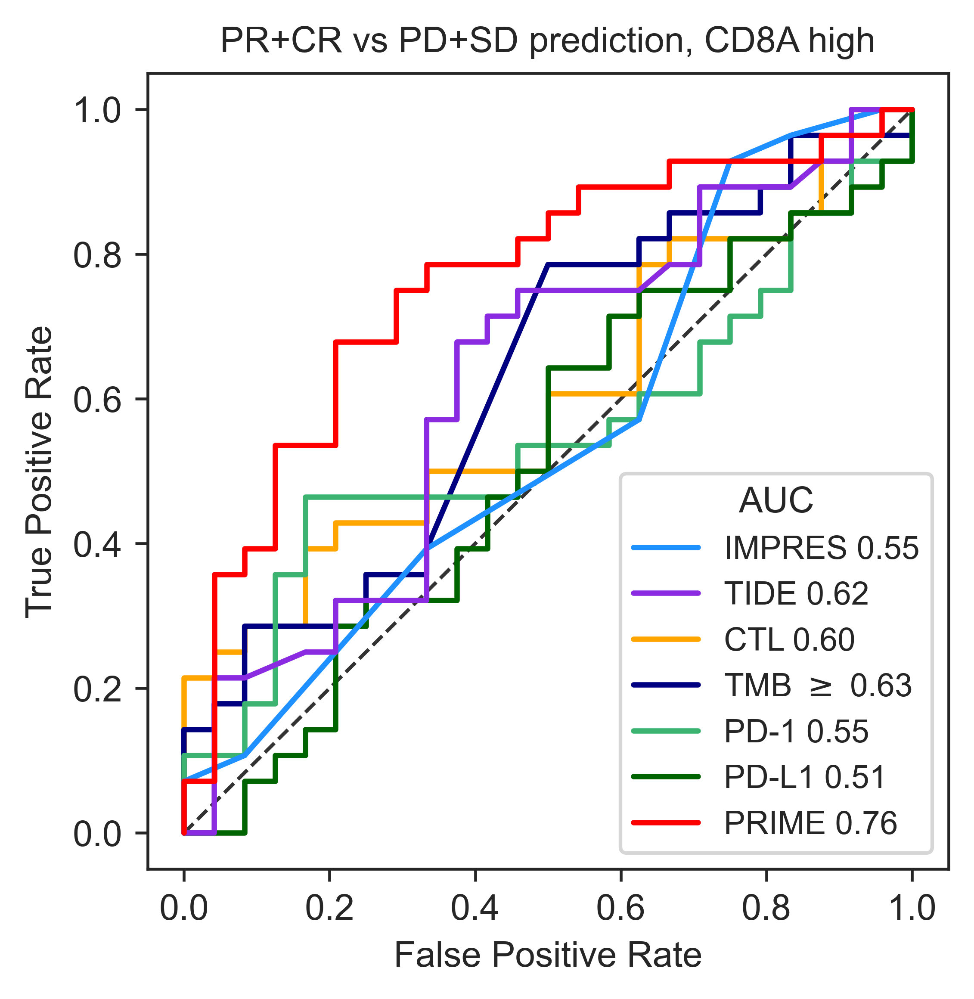

In [40]:

sns.set_style("ticks")

IRS = irs.values.T[0]
data = tpm_bc

#1.
tide_scores = tide_df['TIDE'].values
tide_scores = -tide_scores.reshape(-1,1)

#2.
IMPRES = -IMPRES_scores.reshape(-1,1)

#3.
ctlDF = compute_ctl_score(tpm_bc)
CTL = np.log2(1+ctlDF.values)


#4.
TMB =TMB_aux

#6. Add Prime gene expression multiplied by their weights to obtain a scalarized PRIME score
PRIME_score = np.matmul((weights.reshape(-1,1).T),np.log2(1+data.loc[gsp_psp_stats.index.values]).values.astype(float)).T

#7.
SGpd1 = np.log2(1+tpm_bc.loc[['PDCD1'] ].T.values.astype(float)).reshape(-1,1)

#8.
SGpdl1 = np.log2(1+tpm_bc.loc[['CD274']].T.values.astype(float)).reshape(-1,1)


CTL = (CTL - np.mean(CTL))/np.std(CTL)
PRIME = (PRIME_score - np.mean(PRIME_score))/np.std(PRIME_score)
TMB = (TMB - np.mean(TMB))/np.std(TMB)

SGpd1 = (SGpd1 - np.mean(SGpd1))/np.std(SGpd1)
SGpdl1 = (SGpdl1 - np.mean(SGpdl1))/np.std(SGpdl1)

IMPRES = (IMPRES - np.mean(IMPRES))/np.std(IMPRES)

TIDE = (tide_scores - np.mean(tide_scores))/np.std(tide_scores)

## ML Using iRECIST score (IRS>2 response, IRS>1 DC)
C, I, T, M, S, ST, PD1, PDL1, y = CTL, IMPRES, TIDE, TMB, PRIME_score, PRIME_score+TMB, SGpd1, SGpdl1, (IRS>2).astype(int)


random_state = np.random.RandomState(0)
# n_samples, n_features = X.shape
n_classes = len(np.unique(y))


mean_fpr = np.linspace(0, 1, 100)

test_patients_batch = np.where((batch_inds>4)|(batch_inds==3))[0] #Test set

# ## CD8 stratification
quantiles = np.quantile(log2tpm_bc.loc['CD8A'],[0.25,0.5,0.75])
pt_strat = np.where(log2tpm_bc.loc['CD8A']>quantiles[2])[0]


test_patients_batch = np.intersect1d(pt_strat,test_patients_batch)

print('patients in test set:',len(test_patients_batch))

fpr_t, tpr_t, thresholds = roc_curve(y[test_patients_batch], T[test_patients_batch])
roc_auc_t = auc(fpr_t, tpr_t)

fpr_c, tpr_c, thresholds_c = roc_curve(y[test_patients_batch], C[test_patients_batch])
roc_auc_c = auc(fpr_c, tpr_c)

fpr_m, tpr_m, thresholds_m = roc_curve(y[test_patients_batch], M[test_patients_batch])
roc_auc_m = auc(fpr_m, tpr_m)

fpr_i, tpr_i, thresholds_i = roc_curve(y[test_patients_batch], I[test_patients_batch])
roc_auc_i = auc(fpr_i, tpr_i)

fpr_sig1, tpr_sig1, thresholds_sig1 = roc_curve(y[test_patients_batch], S[test_patients_batch])
roc_auc_sig1 = auc(fpr_sig1, tpr_sig1)

fpr_sig2, tpr_sig2, thresholds_sig2 = roc_curve(y[test_patients_batch], ST[test_patients_batch])
roc_auc_sig2 = auc(fpr_sig2, tpr_sig2)

fpr_pd1, tpr_pd1, thresholds_pd1 = roc_curve(y[test_patients_batch], PD1[test_patients_batch])
roc_auc_pd1 = auc(fpr_pd1, tpr_pd1)

fpr_pdl1, tpr_pdl1, thresholds_pd1 = roc_curve(y[test_patients_batch], PDL1[test_patients_batch])
roc_auc_pdl1 = auc(fpr_pdl1, tpr_pdl1)

    
# Plotting the ROC curve
plt.figure(figsize=(4,4), dpi=600)

plt.plot(fpr_i, tpr_i, color='dodgerblue', label='IMPRES %0.2f' % roc_auc_i, zorder=7)
plt.plot(fpr_t, tpr_t, color='blueviolet', label='TIDE %0.2f' % roc_auc_t, zorder=8)
plt.plot(fpr_c, tpr_c, color='orange', label='CTL %0.2f' % roc_auc_c, zorder=6)
plt.plot(fpr_m, tpr_m, color='navy', label='TMB $\geq$ %0.2f' % roc_auc_m, zorder=6)
plt.plot(fpr_pd1, tpr_pd1, color='mediumseagreen', label='PD-1 %0.2f' % roc_auc_pd1, zorder=6)
plt.plot(fpr_pdl1, tpr_pdl1, color='darkgreen', label='PD-L1 %0.2f' % roc_auc_pdl1, zorder=6)
plt.plot(fpr_sig1, tpr_sig1, color='red', label='PRIME %0.2f' % roc_auc_sig1, zorder=10)
# plt.plot(fpr_sig2, tpr_sig2, color='orchid', label='PRIME+TMB (AUC = %0.2f)' % roc_auc_sig2, zorder=9)

plt.plot([0, 1], [0, 1], "k--", alpha = 0.8, linewidth=1)

# plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Random guess')
plt.xlabel('False Positive Rate', fontsize='medium')
plt.ylabel('True Positive Rate', fontsize='medium')
plt.title('PR+CR vs PD+SD prediction, CD8A high', fontsize='medium')
plt.legend(title='AUC',loc='lower right', fontsize=9)

plt.savefig('score_roc_single_test_5cohorts_cd8hi.pdf', bbox_inches='tight')
plt.show()

In [41]:
PRIME_df = pd.DataFrame(data=PRIME, columns=['PRIME'], index= tpm_bc.keys())
PRIME_aug = pd.concat((PRIME_df,  np.log2(1+tpm_bc.loc[['CD8A']]).T), axis=1)
PRIME_aug = pd.concat((PRIME_aug, irs), axis=1)

quantiles = np.quantile(PRIME_aug['CD8A'],[0.25,0.5,0.75])
PRIME_aug['CD8hi'] = (PRIME_aug['CD8A']>quantiles[1])
PRIME_aug['CD8low'] = (PRIME_aug['CD8A']<quantiles[1])
PRIME_aug['CD8extrema'] = (PRIME_aug['CD8A']<quantiles[1])|(PRIME_aug['CD8A']>quantiles[1])
PRIME_aug['Response'] = (PRIME_aug['iR_score']>2)

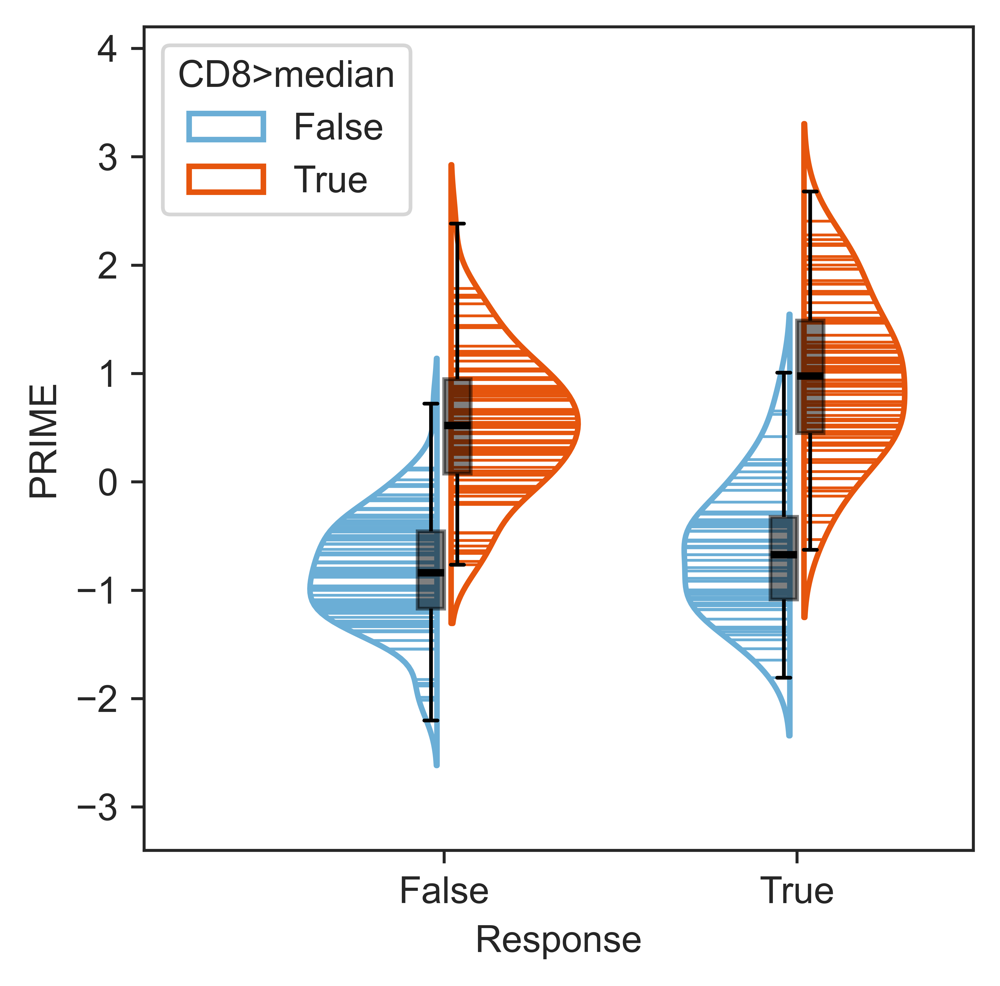

In [42]:
plt.figure(figsize=(4, 4), dpi=1200)
colors = [plt.cm.tab20c(1), plt.cm.tab20c(4)]
sns.violinplot(data=PRIME_aug[PRIME_aug['CD8extrema']==True], x="Response", y="PRIME", hue='CD8hi', palette=colors,split=True, gap=0.1, inner='stick',fill=False)
plt.legend(title='CD8>median', loc='upper left')

sns.boxplot(data=PRIME_aug[PRIME_aug['CD8extrema']==True], x="Response", y="PRIME", 
            palette=['k','k'],hue='CD8hi',whis=2, showfliers=False,width=0.15,legend=None,boxprops=dict(alpha=.5),medianprops={"linewidth": 2})


plt.xlim([-0.85,1.5])
plt.ylim([-3.4,4.2])

plt.savefig('prime_response_violinplot_with_cd8.pdf', bbox_inches='tight')

plt.show()

In [70]:
from scipy import stats

In [71]:
sample1 = PRIME_aug[(PRIME_aug['CD8extrema']==True)&(PRIME_aug['CD8hi']==False)&(PRIME_aug['Response']==1)]['PRIME']
sample2 = PRIME_aug[(PRIME_aug['CD8extrema']==True)&(PRIME_aug['CD8hi']==False)&(PRIME_aug['Response']==0)]['PRIME']

t_statistic, p_value = stats.ttest_ind(sample1, sample2)

# Output the results
print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")

T-statistic: 2.21488456953188
P-value: 0.02819881912228184


In [72]:
sample1 = PRIME_aug[(PRIME_aug['CD8extrema']==True)&(PRIME_aug['CD8hi']==True)&(PRIME_aug['Response']==1)]['PRIME']
sample2 = PRIME_aug[(PRIME_aug['CD8extrema']==True)&(PRIME_aug['CD8hi']==True)&(PRIME_aug['Response']==0)]['PRIME']

t_statistic, p_value = stats.ttest_ind(sample1, sample2)

# Output the results
print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")

T-statistic: 4.040302077896054
P-value: 8.311804309359789e-05
